In [87]:
import networkx as nx
import pandas as pd
from networkx.algorithms.community import girvan_newman
import matplotlib.pyplot as plt
import random
from datetime import datetime, timedelta
import itertools
import community as community_louvain
import matplotlib.pyplot as plt
import numpy as np

In [4]:
# Load the data from CSV (make sure the CSV has the appropriate columns)
file_path = 'call_records.csv'  # Path to your CSV file
df = pd.read_csv(file_path)
print(df.head())

   Calling Party  Called Party             IMEI             IMSI   Call Date  \
0     7806566906    7138293654   62562145495284  718316146034816  2024-08-13   
1     8581916045    8366256065   56867908299113  137911514839499  2024-05-07   
2     8546153259    7028705640  230776734184963  700140413585133  2024-10-25   
3     7982574554    8754470786  135125722662329  161145201063753  2024-11-26   
4     7028705640    8566239944  253463756543498    5803058135918  2024-10-11   

  Call Type Start Time  End Time  Duration (seconds)  
0    SMS In   06:25:50       NaN                   0  
1    SMS In   23:11:17       NaN                   0  
2  Voice In   00:57:08  02:16:59                4791  
3    SMS In   23:11:24       NaN                   0  
4  Voice In   18:44:51  19:21:41                2210  


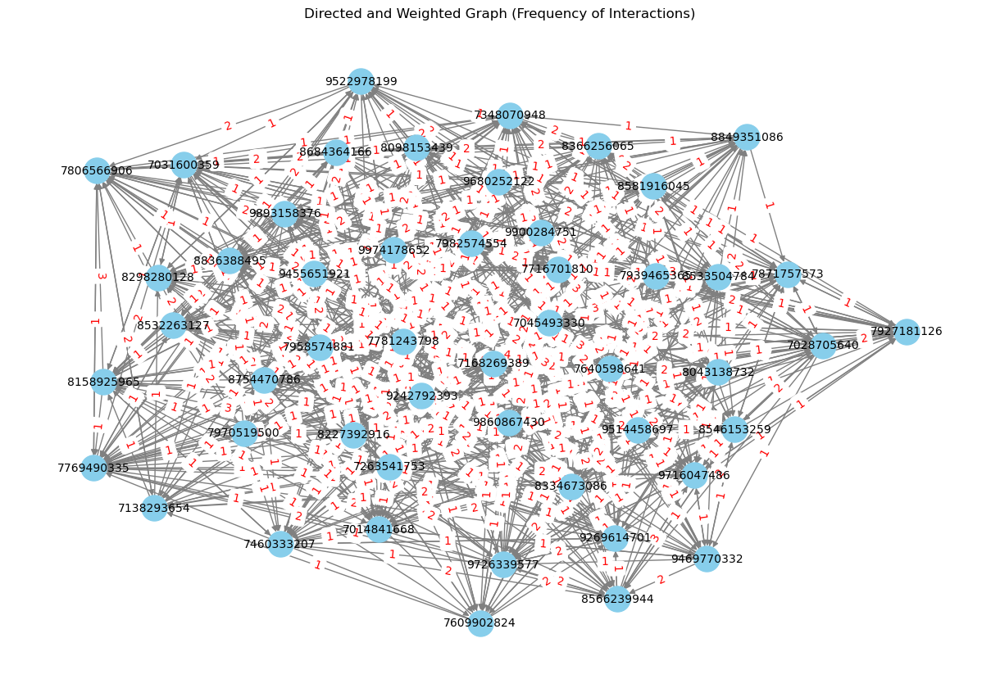

In [5]:
# Creating a Directed Graph (weighted by frequency of calls or SMS)
G = nx.DiGraph()

# Compute frequency of interactions (calls + SMS) between each pair
interaction_counts = df.groupby(['Calling Party', 'Called Party']).size().reset_index(name='Frequency')

# Adding directed edges with frequency as weights
for _, row in interaction_counts.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'], weight=row['Frequency'])

# Remove self-loops
G.remove_edges_from(nx.selfloop_edges(G))

# Visualizing the graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G)  # Position nodes using a force-directed algorithm
weights = nx.get_edge_attributes(G, 'weight')

# Draw the graph
nx.draw(G, pos, with_labels=True, node_size=500, node_color="skyblue", edge_color="gray", font_size=10)
nx.draw_networkx_edge_labels(G, pos, edge_labels=weights, font_color="red")
plt.title("Directed and Weighted Graph (Frequency of Interactions)")
plt.show()


In [6]:
# Calculate the Girvan-Newman algorithm
comp = girvan_newman(G)

In [7]:
# Find the communities with the highest modularity
k = 30  # You can adjust this parameter for different granularity of communities.
limited = itertools.takewhile(lambda c: len(c) <= k, comp)

# Get the first community structure with the desired number of communities
communities = next(limited)

In [8]:
# Print the communities
print("Communities detected by Girvan-Newman:")
for idx, community in enumerate(communities):
    print(f"Community {idx + 1}: {set(community)}")

Communities detected by Girvan-Newman:
Community 1: {8754470786, 7871757573, 8684364166, 8158925965, 8581916045, 8836388495, 8533504784, 8227392916, 7939465365, 7781243798, 9522978199, 7460333207, 7769490335, 7958574881, 7348070948, 8546153259, 8043138732, 9726339577, 8849351086, 8334673086, 8298280128, 8366256065, 7014841668, 7927181126, 8566239944, 9242792393, 9514458697, 7970519500, 7168269389, 9900284751, 9455651921, 7045493330, 8532263127, 9680252122, 7982574554, 9469770332, 9974178652, 8098153439, 9860867430, 7031600359, 7028705640, 9893158376, 7609902824, 9269614701, 7640598641, 7716701810, 7263541753, 7806566906, 9716047486}
Community 2: {7138293654}


In [9]:
# Calculating Modularity Score
modularity_score = nx.algorithms.community.modularity(G, communities)
print(f"Modularity Score: {modularity_score}")

Modularity Score: -0.0003079999999999875


# Alternative: Use 'community-louvain' explicitly
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

# Detect communities using Louvain method
partition = community_louvain.best_partition(G)

# Convert partition into a list of communities
communities = {}
for node, comm in partition.items():
    if comm not in communities:
        communities[comm] = []
    communities[comm].append(node)

# Calculate modularity score for Louvain
modularity_score = nx.algorithms.community.modularity(G, list(communities.values()))
print(f"Louvain Modularity Score: {modularity_score}")

# Visualize the communities
color_map = {node: partition[node] for node in G.nodes()}
node_colors = [color_map[node] for node in G.nodes()]

# Visualizing the graph with community colors
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_size=500, node_color=node_colors, font_size=10, cmap=plt.cm.jet)
plt.title("Community Detection using Louvain")
plt.show()


In [11]:
pip show python-louvain

Name: python-louvainNote: you may need to restart the kernel to use updated packages.

Version: 0.16
Summary: Louvain algorithm for community detection
Home-page: https://github.com/taynaud/python-louvain
Author: Thomas Aynaud
Author-email: taynaud@gmail.com
License: BSD
Location: C:\Users\Lenovo\anaconda3\Lib\site-packages
Requires: networkx, numpy
Required-by: 


In [12]:
import community as community_louvain

In [13]:
!pip install community

In [14]:
pip install python-louvain

Note: you may need to restart the kernel to use updated packages.


In [15]:
# Color nodes based on community assignment
color_map = {}
for idx, community in enumerate(communities):
    for node in community:
        color_map[node] = idx

# Creating a list of colors for the nodes
node_colors = [color_map.get(node, 0) for node in G.nodes()]

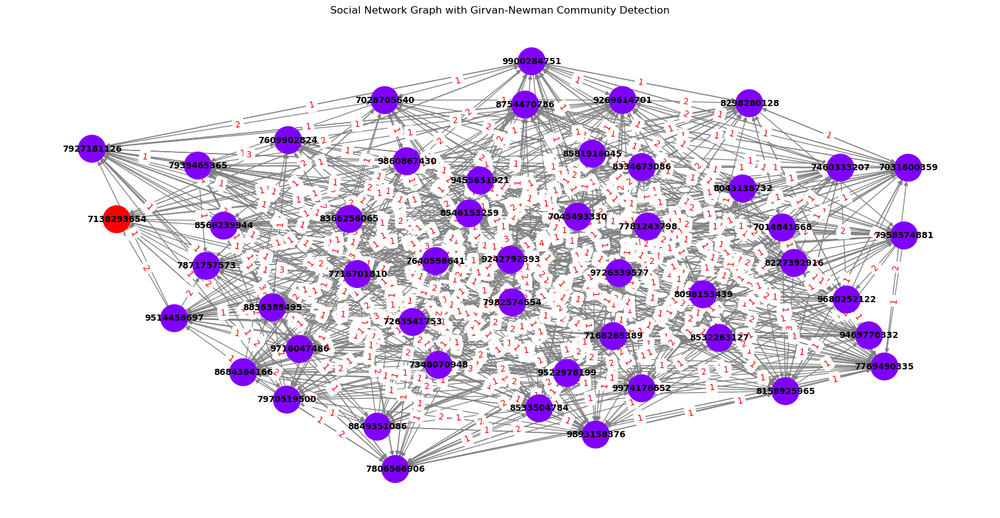

In [16]:
# Drawing the graph with different colors for each community
plt.figure(figsize=(16, 8))
pos = nx.spring_layout(G, seed=25)
nx.draw(G, pos, with_labels=True, node_size=1000,
        node_color=node_colors, cmap=plt.cm.rainbow,
        font_size=10, font_weight='bold', edge_color='gray')

# Add edge weights as labels
labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, font_color='red')

# Display the plot
plt.title("Social Network Graph with Girvan-Newman Community Detection")
plt.show()

Modularity Score: 0.09295464711422398


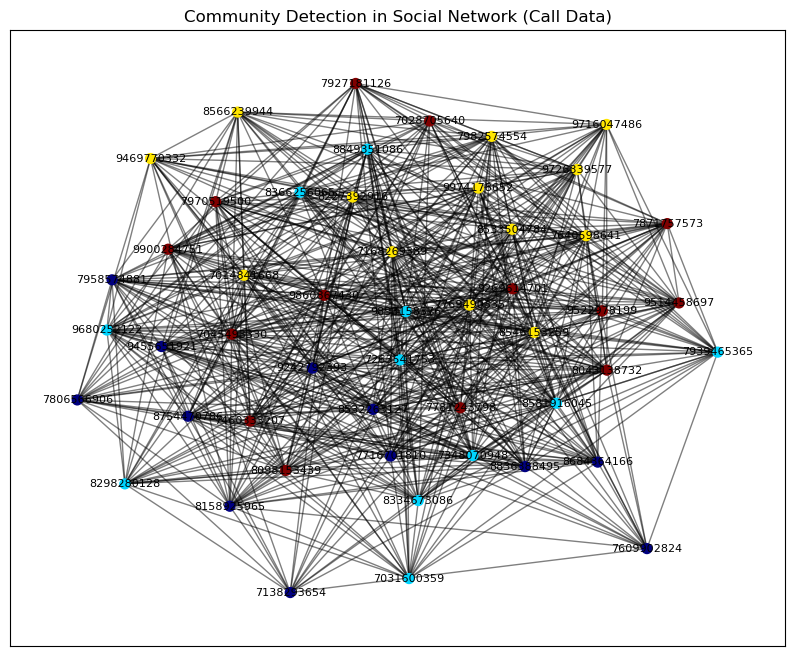

Detected Communities:
Community 0: [7806566906, 7138293654, 8754470786, 9242792393, 7716701810, 7609902824, 8684364166, 8158925965, 8532263127, 7958574881, 9455651921, 8836388495]
Community 1: [8581916045, 8366256065, 8334673086, 7939465365, 7348070948, 8298280128, 7031600359, 8849351086, 9680252122, 7263541753, 9893158376]
Community 2: [8546153259, 7982574554, 8566239944, 9469770332, 7640598641, 8227392916, 7168269389, 9716047486, 8533504784, 7769490335, 9974178652, 7014841668, 9726339577]
Community 3: [7028705640, 9514458697, 9900284751, 7045493330, 7781243798, 8098153439, 7871757573, 9522978199, 9860867430, 7927181126, 9269614701, 7970519500, 8043138732, 7460333207]


In [17]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

# Assuming the CSV has columns 'caller_id', 'receiver_id', and 'timestamp'
# Example: caller_id, receiver_id, timestamp
# 101, 102, 2025-01-01 10:00:00
# 102, 103, 2025-01-01 10:05:00

# Step 2: Build a graph based on the call data
G = nx.Graph()

for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])

# Step 3: Apply the Louvain method for community detection
partition = community_louvain.best_partition(G)

# Step 4: Compute the modularity score
modularity_score = community_louvain.modularity(partition, G)
print(f"Modularity Score: {modularity_score}")

# Step 5: Visualize the communities
# Generate a layout for the graph
pos = nx.spring_layout(G)

# Draw the graph with the communities
plt.figure(figsize=(10, 8))

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=colors, cmap=plt.cm.jet, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

plt.title("Community Detection in Social Network (Call Data)")
plt.show()

# Step 6: Display the communities
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.09155429781361189


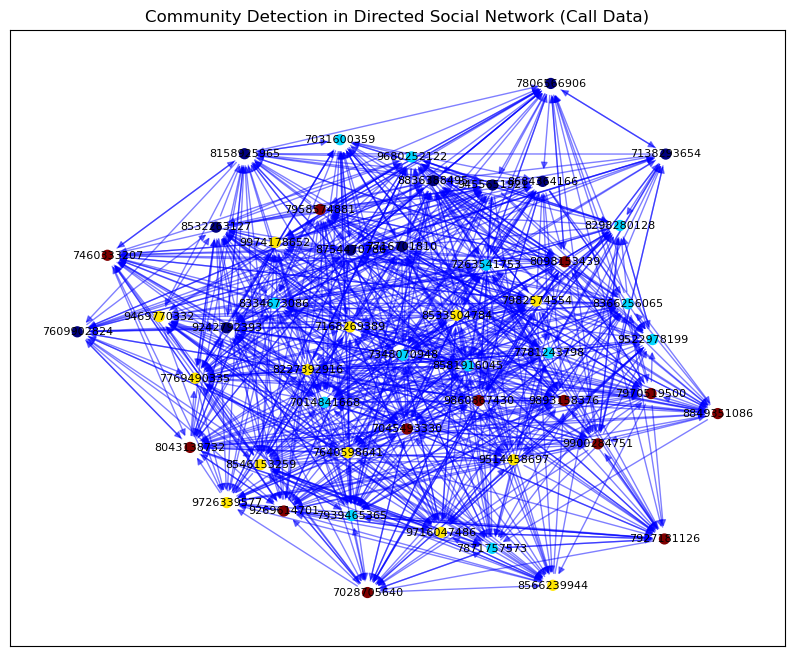

Detected Communities:
Community 0: [7806566906, 7138293654, 8754470786, 9242792393, 7716701810, 7609902824, 8684364166, 8158925965, 8532263127, 9455651921, 8836388495]
Community 1: [8581916045, 8366256065, 8334673086, 7781243798, 7939465365, 7348070948, 8298280128, 7031600359, 7871757573, 9522978199, 9680252122, 7014841668, 7263541753]
Community 2: [8546153259, 7982574554, 8566239944, 9514458697, 9469770332, 7640598641, 8227392916, 7168269389, 9716047486, 8533504784, 7769490335, 9974178652, 9726339577]
Community 3: [7028705640, 9900284751, 7045493330, 8098153439, 7958574881, 9860867430, 7927181126, 9269614701, 7970519500, 8043138732, 8849351086, 7460333207, 9893158376]


In [18]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

G = nx.DiGraph()  # Create a directed graph

# Add edges to the graph with direction
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Step 3: Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Step 4: Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Step 5: Visualize the communities
# Generate a layout for the graph
pos = nx.spring_layout(G)

# Draw the directed graph with the communities
plt.figure(figsize=(10, 8))

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=colors, cmap=plt.cm.jet, node_size=50)

# Draw directed edges
nx.draw_networkx_edges(G, pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Step 6: Display the communities
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


In [19]:
pip install cosmograph

Note: you may need to restart the kernel to use updated packages.


In [20]:
pip install cosmograph community matplotlib networkx

Note: you may need to restart the kernel to use updated packages.


Modularity Score: 0.08901883391138019


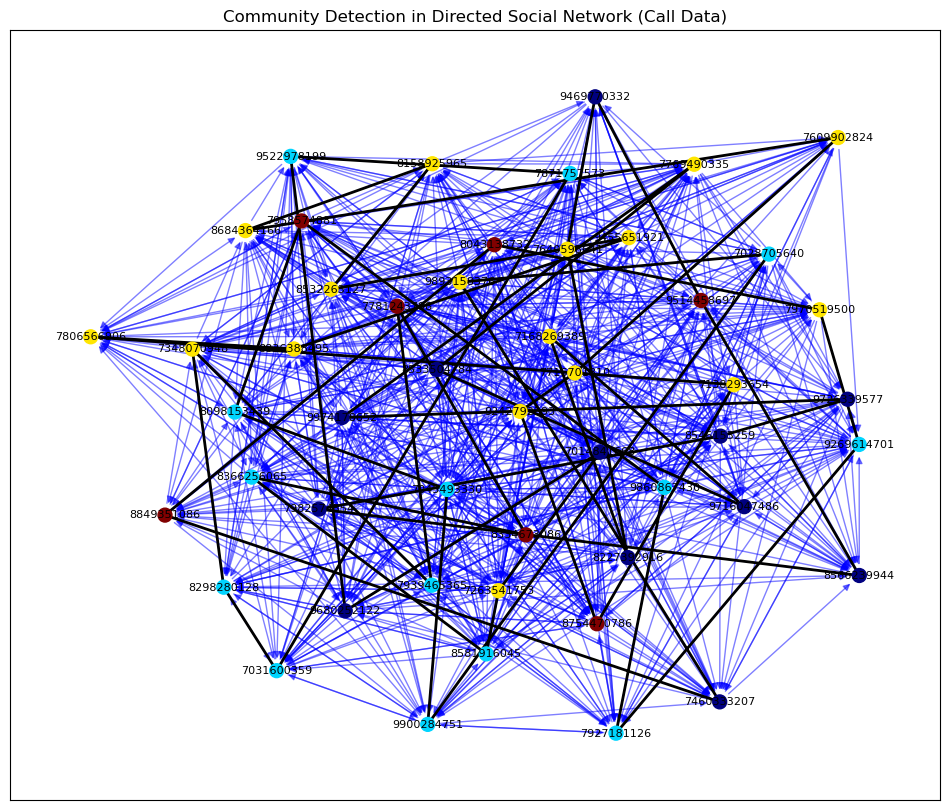

Detected Communities:
Community 2: [7806566906, 7138293654, 9242792393, 7716701810, 7640598641, 7609902824, 8684364166, 7348070948, 8158925965, 8532263127, 7168269389, 9455651921, 7769490335, 7970519500, 7263541753, 8836388495, 9893158376]
Community 1: [8581916045, 8366256065, 7028705640, 9900284751, 7045493330, 7939465365, 8098153439, 8298280128, 7031600359, 7871757573, 9522978199, 9860867430, 7927181126, 9269614701]
Community 0: [8546153259, 7982574554, 8566239944, 9469770332, 8227392916, 9716047486, 8533504784, 9974178652, 9680252122, 7014841668, 9726339577, 7460333207]
Community 3: [8754470786, 9514458697, 8334673086, 7781243798, 7958574881, 8043138732, 8849351086]


In [21]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Generate a layout for the graph (spring layout will group nodes that are part of the same community closer)
pos = nx.spring_layout(G, k=0.15, iterations=20)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

# Highlight community borders (by adding a rectangle or polygon around communities)
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = [pos[node] for node in nodes]
    
    # Create a polygon or rectangle around the community
    x_coords, y_coords = zip(*community_pos)
    plt.gca().add_patch(plt.Polygon(list(zip(x_coords, y_coords)), fill=None, edgecolor='black', lw=2))

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.09046750987324928


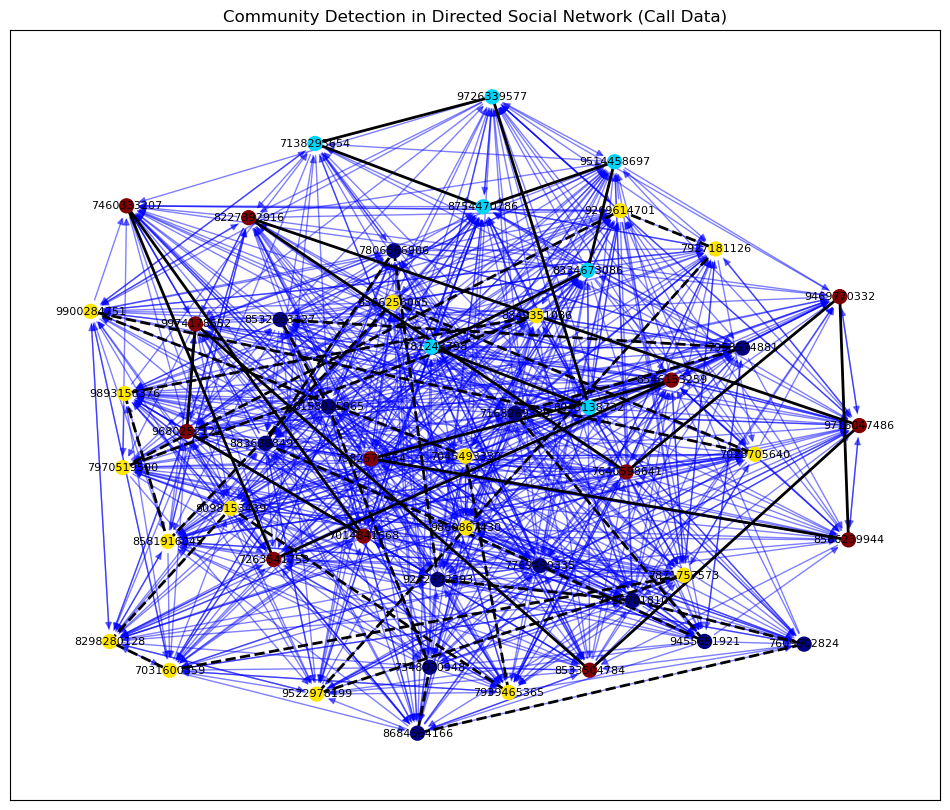

Detected Communities:
Community 0: [7806566906, 9242792393, 7716701810, 7609902824, 8684364166, 7348070948, 8158925965, 8532263127, 7958574881, 7168269389, 9455651921, 7769490335, 8836388495]
Community 1: [7138293654, 8754470786, 9514458697, 8334673086, 7781243798, 8043138732, 9726339577]
Community 2: [8581916045, 8366256065, 7028705640, 9900284751, 7045493330, 7939465365, 8098153439, 8298280128, 7031600359, 7871757573, 9522978199, 9860867430, 7927181126, 9269614701, 7970519500, 8849351086, 9893158376]
Community 3: [8546153259, 7982574554, 8566239944, 9469770332, 7640598641, 8227392916, 9716047486, 8533504784, 9974178652, 9680252122, 7014841668, 7460333207, 7263541753]


In [41]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random

# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Generate a layout for the graph (spring layout will group nodes that are part of the same community closer)
pos = nx.spring_layout(G, k=0.15, iterations=20)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

# Highlight community borders (by adding a rectangle or polygon around communities)
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Create a random dashed or solid line for each community's border
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = [pos[node] for node in nodes]
    
    # Create a polygon around the community
    x_coords, y_coords = zip(*community_pos)
    
    # Randomly choose between dashed or continuous line for the community border
    line_style = '-' if random.choice([True, False]) else '--'  # 50% chance for dashed line
    
    plt.gca().add_patch(plt.Polygon(list(zip(x_coords, y_coords)), 
                                   fill=None, 
                                   edgecolor='black', 
                                   linestyle=line_style, 
                                   lw=2))

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.09144191022929316


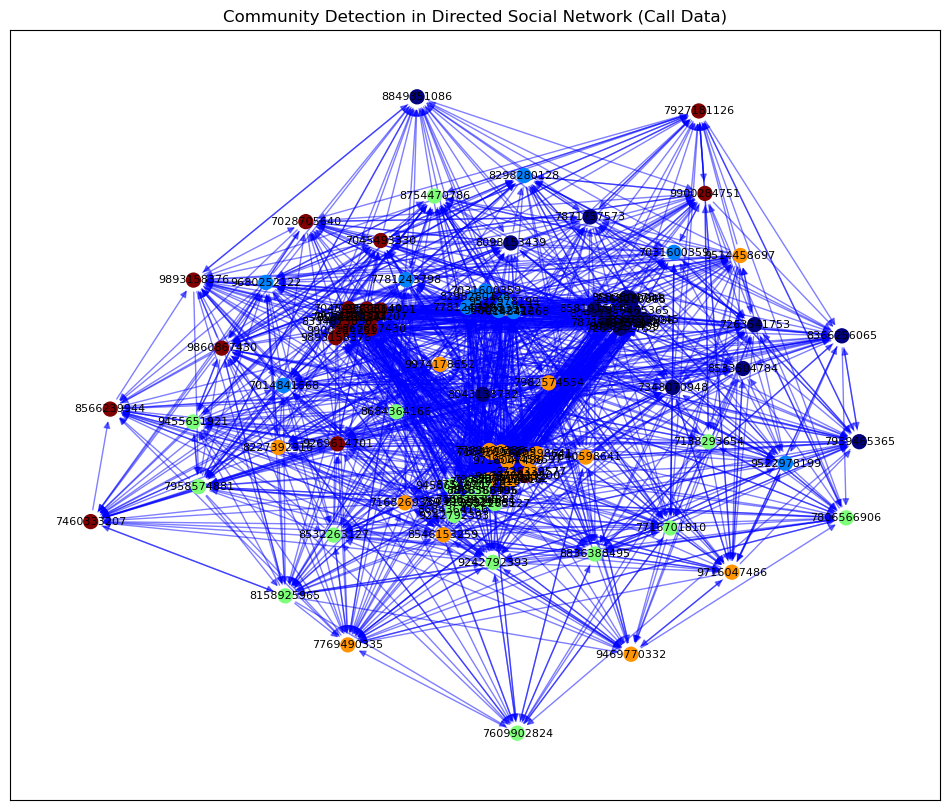

Detected Communities:
Community 2: [7806566906, 7138293654, 8754470786, 9242792393, 7716701810, 7609902824, 8684364166, 8158925965, 8532263127, 7958574881, 9455651921, 8836388495]
Community 0: [8581916045, 8366256065, 8334673086, 7939465365, 8098153439, 7348070948, 7871757573, 8533504784, 8043138732, 8849351086, 7263541753]
Community 3: [8546153259, 7982574554, 9514458697, 9469770332, 7640598641, 8227392916, 7168269389, 9716047486, 7769490335, 9974178652, 9726339577]
Community 4: [7028705640, 8566239944, 9900284751, 7045493330, 9860867430, 7927181126, 9269614701, 7970519500, 7460333207, 9893158376]
Community 1: [7781243798, 8298280128, 7031600359, 9522978199, 9680252122, 7014841668]


In [43]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random

# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Generate a layout for the graph (spring layout will group nodes that are part of the same community closer)
pos = nx.spring_layout(G, k=0.15, iterations=20)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

# Highlight community borders and adjust node positions within communities
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Adjust positions within communities to gather nodes together
adjusted_pos = pos.copy()

# Increase the proximity between nodes of the same community
for community_id, nodes in communities.items():
    # Calculate the average position for the community
    avg_x = sum(adjusted_pos[node][0] for node in nodes) / len(nodes)
    avg_y = sum(adjusted_pos[node][1] for node in nodes) / len(nodes)

    # Shift all nodes of the same community closer to the average position
    for node in nodes:
        adjusted_pos[node] = (avg_x + random.uniform(-0.05, 0.05), avg_y + random.uniform(-0.05, 0.05))

# Create a random dashed or solid line for each community's border
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = [adjusted_pos[node] for node in nodes]
    
    # Create a polygon around the community
    x_coords, y_coords = zip(*community_pos)
    
    # Randomly choose between dashed or continuous line for the community border
    line_style = '-' if random.choice([True, False]) else '--'  # 50% chance for dashed line
    
    plt.gca().add_patch(plt.Polygon(list(zip(x_coords, y_coords)), 
                                   fill=None, 
                                   edgecolor='black', 
                                   linestyle=line_style, 
                                   lw=2))

# Update the visualization with adjusted node positions
nx.draw_networkx_nodes(G, adjusted_pos, node_color=colors, cmap=plt.cm.jet, node_size=100)
nx.draw_networkx_edges(G, adjusted_pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")
nx.draw_networkx_labels(G, adjusted_pos, font_size=8, font_color="black")

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.08801296503172701


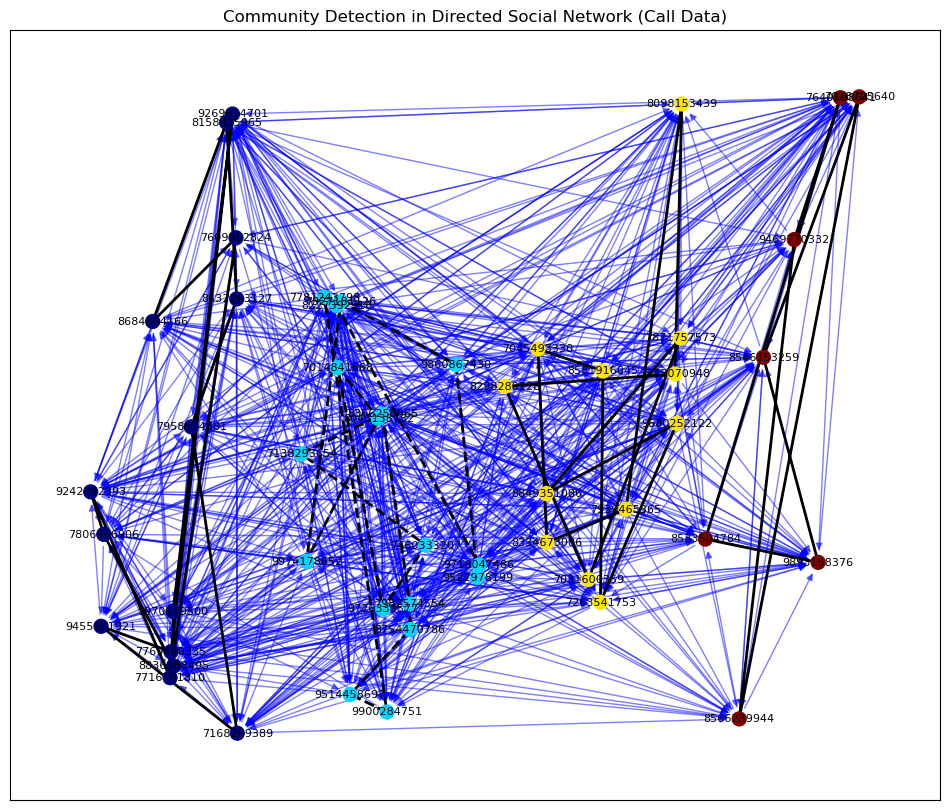

Detected Communities:
Community 0: [7806566906, 9242792393, 7716701810, 7609902824, 8684364166, 8158925965, 8532263127, 7958574881, 7168269389, 9455651921, 7769490335, 9269614701, 7970519500, 8836388495]
Community 1: [7138293654, 8366256065, 7982574554, 8754470786, 9514458697, 9900284751, 7781243798, 8227392916, 9716047486, 9522978199, 9860867430, 7927181126, 9974178652, 8043138732, 7014841668, 9726339577, 7460333207]
Community 2: [8581916045, 7045493330, 8334673086, 7939465365, 8098153439, 7348070948, 8298280128, 7031600359, 7871757573, 8849351086, 9680252122, 7263541753]
Community 3: [8546153259, 7028705640, 8566239944, 9469770332, 7640598641, 8533504784, 9893158376]


In [45]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random

# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Adjust positions within communities to gather nodes together
adjusted_pos = {}

# Increase the proximity between nodes of the same community
for community_id, nodes in communities.items():
    # Generate positions close to each other for nodes in the same community
    x_pos = [random.uniform(-1, 1) for _ in nodes]  # Random x positions for each node
    y_pos = [random.uniform(-1, 1) for _ in nodes]  # Random y positions for each node

    # Assign adjusted positions for nodes
    for node, x, y in zip(nodes, x_pos, y_pos):
        adjusted_pos[node] = (x + community_id * 2, y)  # Adjust to prevent overlap between communities

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, adjusted_pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, adjusted_pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, adjusted_pos, font_size=8, font_color="black")

# Create a random dashed or solid line for each community's border
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = [adjusted_pos[node] for node in nodes]
    
    # Create a polygon around the community
    x_coords, y_coords = zip(*community_pos)
    
    # Randomly choose between dashed or continuous line for the community border
    line_style = '-' if random.choice([True, False]) else '--'  # 50% chance for dashed line
    
    plt.gca().add_patch(plt.Polygon(list(zip(x_coords, y_coords)), 
                                   fill=None, 
                                   edgecolor='black', 
                                   linestyle=line_style, 
                                   lw=2))

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.08840294994931319


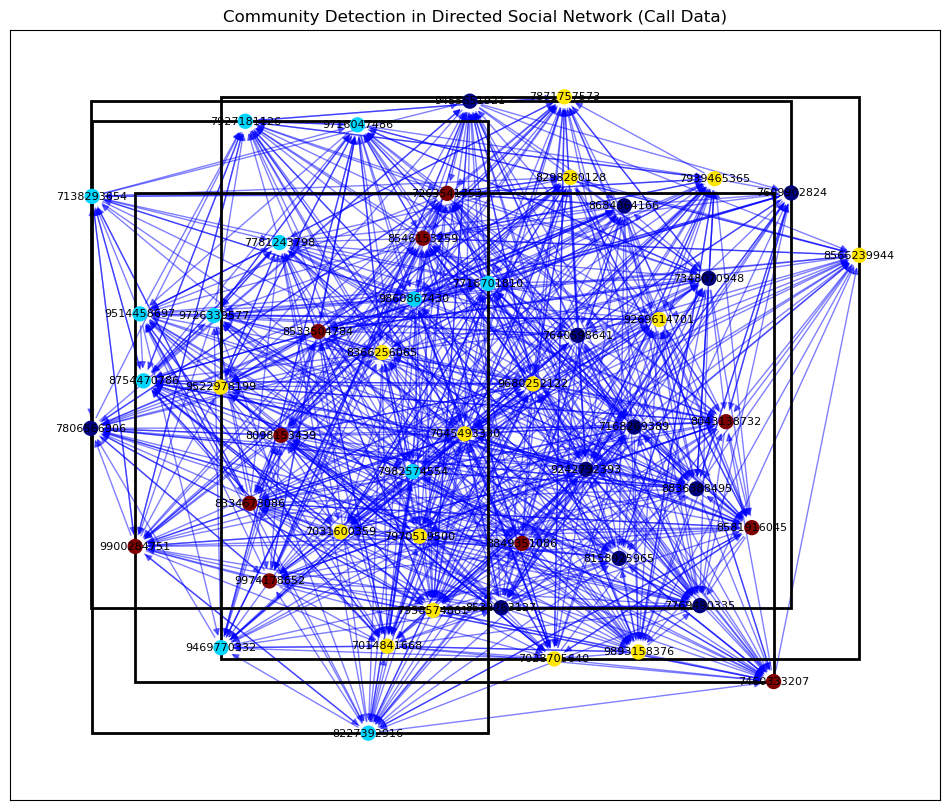

Detected Communities:
Community 0: [7806566906, 9242792393, 7640598641, 7609902824, 8684364166, 7348070948, 8158925965, 8532263127, 7168269389, 9455651921, 7769490335, 8836388495]
Community 1: [7138293654, 7982574554, 8754470786, 7716701810, 9514458697, 9469770332, 7781243798, 8227392916, 9716047486, 9860867430, 7927181126, 9726339577]
Community 3: [8581916045, 8546153259, 9900284751, 8334673086, 8098153439, 8533504784, 9974178652, 8043138732, 8849351086, 7460333207, 7263541753]
Community 2: [8366256065, 7028705640, 8566239944, 7045493330, 7939465365, 8298280128, 7958574881, 7031600359, 7871757573, 9522978199, 9269614701, 7970519500, 9680252122, 7014841668, 9893158376]


In [47]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random

# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Generate a layout for the graph (spring layout will group nodes that are part of the same community closer)
pos = nx.spring_layout(G, k=0.15, iterations=20)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

# Highlight community borders by creating rectangles around communities
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Draw a border for each community
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = [pos[node] for node in nodes]
    
    # Get the x and y coordinates of all nodes in the community
    x_coords, y_coords = zip(*community_pos)
    
    # Create a border around the community (using a rectangle or polygon)
    # Use the min/max coordinates to define a bounding box for the community
    min_x, max_x = min(x_coords), max(x_coords)
    min_y, max_y = min(y_coords), max(y_coords)
    
    # Create a random dashed or solid line for the community border
    line_style = '-' if random.choice([True, False]) else '--'  # 50% chance for dashed line
    
    # Draw a rectangle (bounding box) around the community
    plt.gca().add_patch(plt.Rectangle((min_x, min_y), max_x - min_x, max_y - min_y, 
                                      linewidth=2, edgecolor='black', 
                                      facecolor='none', linestyle=line_style))

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.091010341905509


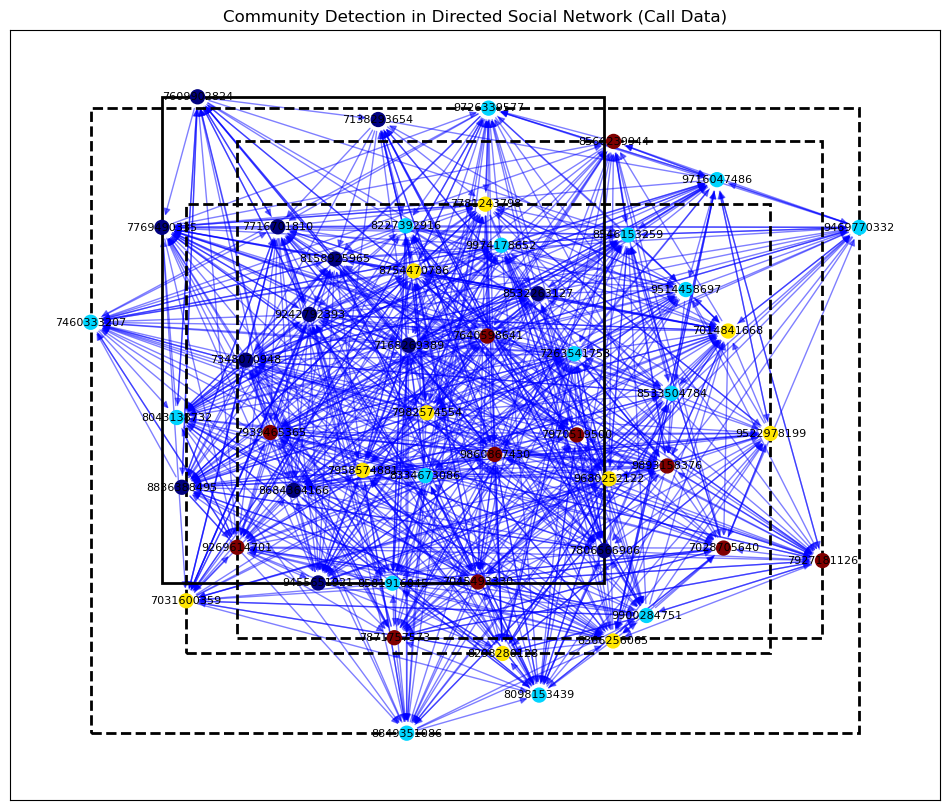

Detected Communities:
Community 0: [7806566906, 7138293654, 9242792393, 7716701810, 7609902824, 8684364166, 7348070948, 8158925965, 8532263127, 7168269389, 9455651921, 7769490335, 8836388495]
Community 1: [8581916045, 8546153259, 9514458697, 9469770332, 9900284751, 8334673086, 8098153439, 8227392916, 9716047486, 8533504784, 9974178652, 8043138732, 8849351086, 9726339577, 7460333207, 7263541753]
Community 2: [8366256065, 7982574554, 8754470786, 7781243798, 8298280128, 7958574881, 7031600359, 9522978199, 9680252122, 7014841668]
Community 3: [7028705640, 8566239944, 7045493330, 7640598641, 7939465365, 7871757573, 9860867430, 7927181126, 9269614701, 7970519500, 9893158376]


In [49]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random

# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Generate a layout for the graph (spring layout will group nodes that are part of the same community closer)
pos = nx.spring_layout(G, k=0.15, iterations=20)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

# Highlight community borders by creating rectangles around communities
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Draw a border for each community
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = [pos[node] for node in nodes]
    
    # Get the x and y coordinates of all nodes in the community
    x_coords, y_coords = zip(*community_pos)
    
    # Create a bounding box around the community
    min_x, max_x = min(x_coords), max(x_coords)
    min_y, max_y = min(y_coords), max(y_coords)
    
    # Randomly choose between dashed or continuous line for the community border
    line_style = '-' if random.choice([True, False]) else '--'  # 50% chance for dashed line
    
    # Draw a rectangle (bounding box) around the community
    plt.gca().add_patch(plt.Rectangle((min_x, min_y), max_x - min_x, max_y - min_y, 
                                      linewidth=2, edgecolor='black', 
                                      facecolor='none', linestyle=line_style))

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.09124410808089209


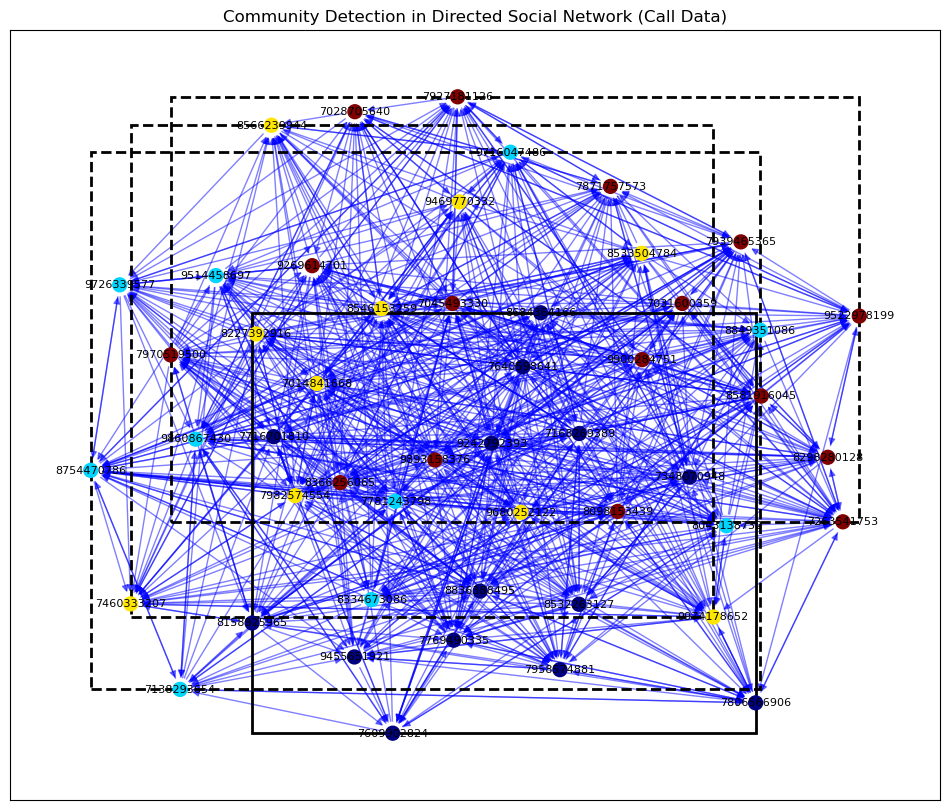

Detected Communities:
Community 0: [7806566906, 9242792393, 7716701810, 7640598641, 7609902824, 8684364166, 7348070948, 8158925965, 8532263127, 7958574881, 7168269389, 9455651921, 7769490335, 8836388495]
Community 1: [7138293654, 8754470786, 9514458697, 8334673086, 7781243798, 9716047486, 9860867430, 8043138732, 8849351086, 9726339577]
Community 3: [8581916045, 8366256065, 7028705640, 9900284751, 7045493330, 7939465365, 8098153439, 8298280128, 7031600359, 7871757573, 9522978199, 7927181126, 9269614701, 7970519500, 7263541753, 9893158376]
Community 2: [8546153259, 7982574554, 8566239944, 9469770332, 8227392916, 8533504784, 9974178652, 9680252122, 7014841668, 7460333207]


In [51]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random

# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Generate a layout for the graph (spring layout will group nodes that are part of the same community closer)
pos = nx.spring_layout(G, k=0.15, iterations=20)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Draw borders around each community using bounding boxes
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = [pos[node] for node in nodes]
    
    # Get the x and y coordinates of all nodes in the community
    x_coords, y_coords = zip(*community_pos)
    
    # Create a bounding box around the community (min/max coordinates)
    min_x, max_x = min(x_coords), max(x_coords)
    min_y, max_y = min(y_coords), max(y_coords)
    
    # Randomly choose between dashed or continuous line for the community border
    line_style = '-' if random.choice([True, False]) else '--'  # 50% chance for dashed line
    
    # Draw a rectangle (bounding box) around the community
    plt.gca().add_patch(plt.Rectangle((min_x, min_y), max_x - min_x, max_y - min_y, 
                                      linewidth=2, edgecolor='black', 
                                      facecolor='none', linestyle=line_style))

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.09002357891519008


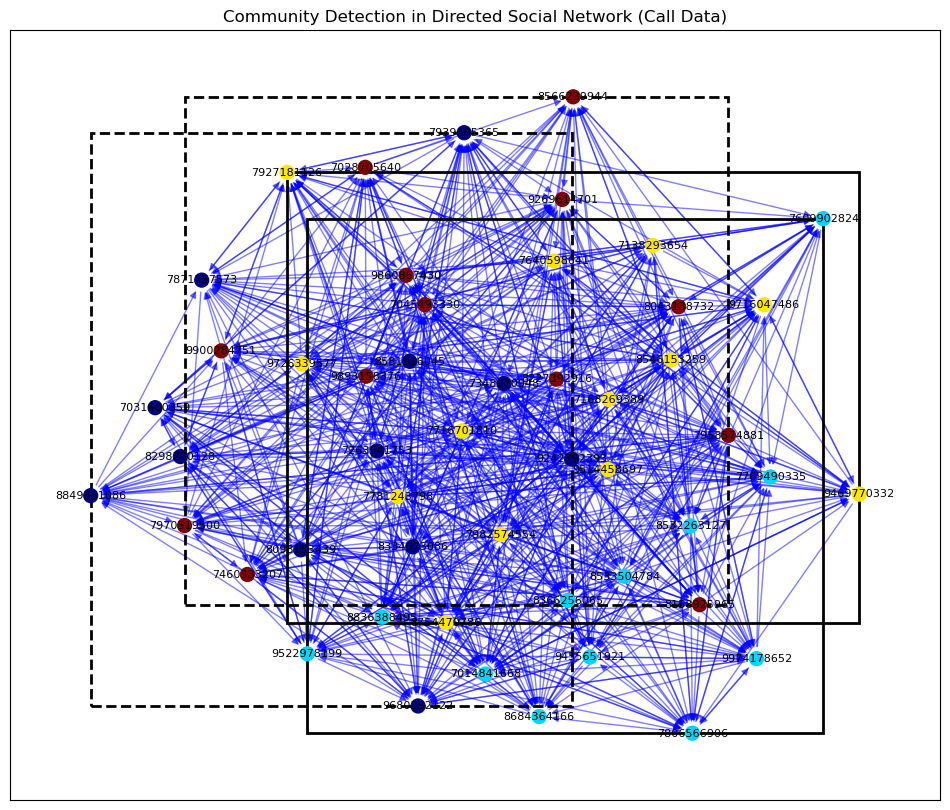

Detected Communities:
Community 1: [7806566906, 8366256065, 7609902824, 8684364166, 8532263127, 9455651921, 9522978199, 8533504784, 7769490335, 9974178652, 7014841668, 8836388495]
Community 2: [7138293654, 8546153259, 7982574554, 8754470786, 7716701810, 9514458697, 9469770332, 7781243798, 7640598641, 7168269389, 9716047486, 7927181126, 9726339577]
Community 0: [8581916045, 9242792393, 8334673086, 7939465365, 8098153439, 7348070948, 8298280128, 7031600359, 7871757573, 8849351086, 9680252122, 7263541753]
Community 3: [7028705640, 8566239944, 9900284751, 7045493330, 8227392916, 8158925965, 7958574881, 9860867430, 9269614701, 7970519500, 8043138732, 7460333207, 9893158376]


In [53]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random

# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Generate a layout for the graph (spring layout will group nodes that are part of the same community closer)
pos = nx.spring_layout(G, k=0.15, iterations=20)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Draw borders around each community using bounding boxes or polygons
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = [pos[node] for node in nodes]
    
    # Get the x and y coordinates of all nodes in the community
    x_coords, y_coords = zip(*community_pos)
    
    # Create a bounding box around the community (min/max coordinates)
    min_x, max_x = min(x_coords), max(x_coords)
    min_y, max_y = min(y_coords), max(y_coords)
    
    # Randomly choose between dashed or continuous line for the community border
    line_style = '-' if random.choice([True, False]) else '--'  # 50% chance for dashed line
    
    # Draw a rectangle (bounding box) around the community
    plt.gca().add_patch(plt.Rectangle((min_x, min_y), max_x - min_x, max_y - min_y, 
                                      linewidth=2, edgecolor='black', 
                                      facecolor='none', linestyle=line_style))

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.09709388184468484


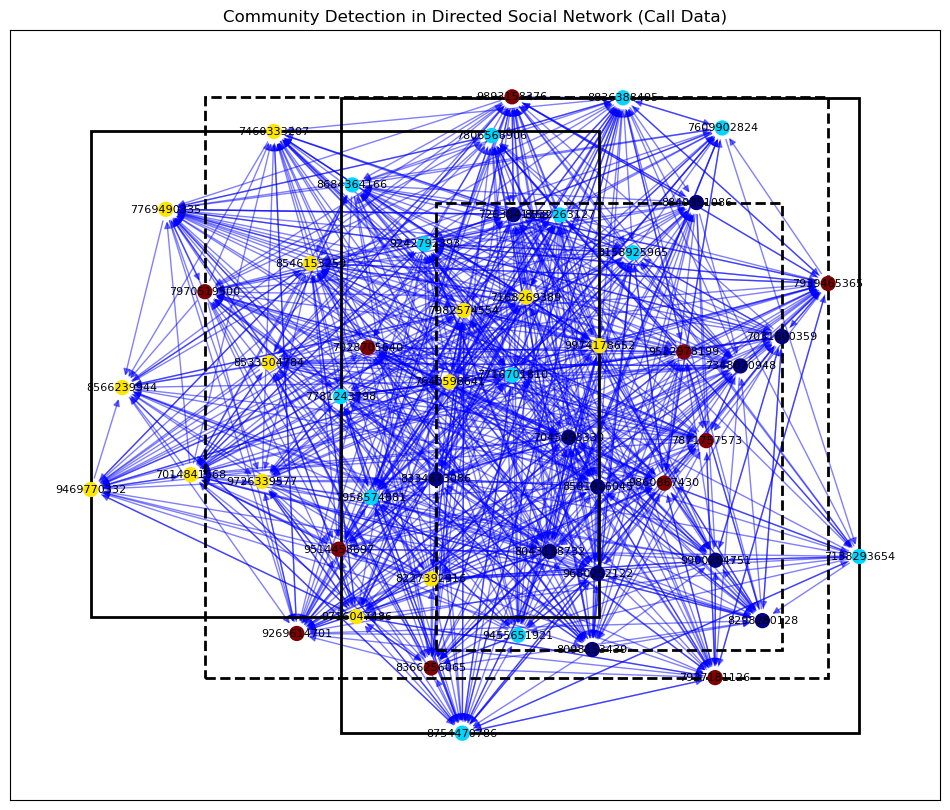

Detected Communities:
Community 1: [7806566906, 7138293654, 8754470786, 9242792393, 7716701810, 7781243798, 7609902824, 8684364166, 8158925965, 8532263127, 7958574881, 9455651921, 8836388495]
Community 0: [8581916045, 9900284751, 7045493330, 8334673086, 8098153439, 7348070948, 8298280128, 7031600359, 8043138732, 8849351086, 9680252122, 7263541753]
Community 3: [8366256065, 7028705640, 9514458697, 7939465365, 7871757573, 9522978199, 9860867430, 7927181126, 9269614701, 7970519500, 9893158376]
Community 2: [8546153259, 7982574554, 8566239944, 9469770332, 7640598641, 8227392916, 7168269389, 9716047486, 8533504784, 7769490335, 9974178652, 7014841668, 9726339577, 7460333207]


In [55]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random

# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Use spring layout for the positions of the nodes (which will keep nodes from the same community close together)
pos = nx.spring_layout(G, k=0.15, iterations=20)

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

# Create a random dashed or solid line for each community's border
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = [pos[node] for node in nodes]
    
    # Create a polygon around the community (bounding box)
    x_coords, y_coords = zip(*community_pos)
    
    # Calculate the min and max x and y values to define a bounding box
    min_x, max_x = min(x_coords), max(x_coords)
    min_y, max_y = min(y_coords), max(y_coords)
    
    # Randomly choose between dashed or continuous line for the community border
    line_style = '-' if random.choice([True, False]) else '--'  # 50% chance for dashed line
    
    # Draw the bounding box (polygon)
    plt.gca().add_patch(plt.Rectangle((min_x, min_y), max_x - min_x, max_y - min_y, 
                                      linewidth=2, edgecolor='black', 
                                      facecolor='none', linestyle=line_style))

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.09293216959736025


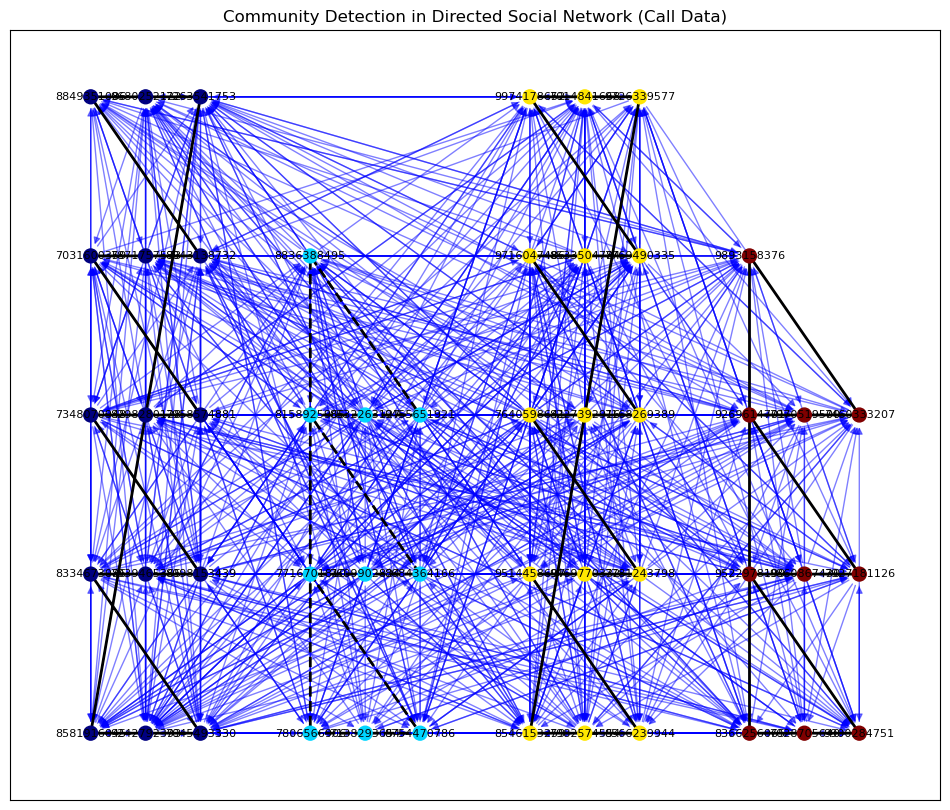

Detected Communities:
Community 1: [7806566906, 7138293654, 8754470786, 7716701810, 7609902824, 8684364166, 8158925965, 8532263127, 9455651921, 8836388495]
Community 0: [8581916045, 9242792393, 7045493330, 8334673086, 7939465365, 8098153439, 7348070948, 8298280128, 7958574881, 7031600359, 7871757573, 8043138732, 8849351086, 9680252122, 7263541753]
Community 3: [8366256065, 7028705640, 9900284751, 9522978199, 9860867430, 7927181126, 9269614701, 7970519500, 7460333207, 9893158376]
Community 2: [8546153259, 7982574554, 8566239944, 9514458697, 9469770332, 7781243798, 7640598641, 8227392916, 7168269389, 9716047486, 8533504784, 7769490335, 9974178652, 7014841668, 9726339577]


In [57]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random

# Create a directed graph G
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Adjust positions within communities to gather nodes together
adjusted_pos = {}

# Increase the proximity between nodes of the same community
community_offset = 2  # Spacing between different communities
for community_id, nodes in communities.items():
    # Create a basic grid layout for each community to keep nodes together
    n = len(nodes)
    if n == 1:
        adjusted_pos[nodes[0]] = (community_offset * community_id, 0)  # Single node in community
    else:
        # Distribute nodes evenly on a grid within the community
        x_pos = [community_offset * community_id + (i % 3) * 0.5 for i in range(n)]  # 3 columns
        y_pos = [i // 3 * 0.5 for i in range(n)]  # 3 rows
        # Assign adjusted positions for nodes
        for node, x, y in zip(nodes, x_pos, y_pos):
            adjusted_pos[node] = (x, y)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, adjusted_pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, adjusted_pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, adjusted_pos, font_size=8, font_color="black")

# Create a random dashed or solid line for each community's border
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = [adjusted_pos[node] for node in nodes]
    
    # Create a polygon around the community
    x_coords, y_coords = zip(*community_pos)
    
    # Randomly choose between dashed or continuous line for the community border
    line_style = '-' if random.choice([True, False]) else '--'  # 50% chance for dashed line
    
    plt.gca().add_patch(plt.Polygon(list(zip(x_coords, y_coords)),
                                     fill=None,
                                     edgecolor='black',
                                     linestyle=line_style,
                                     lw=2))

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.0922432337054861


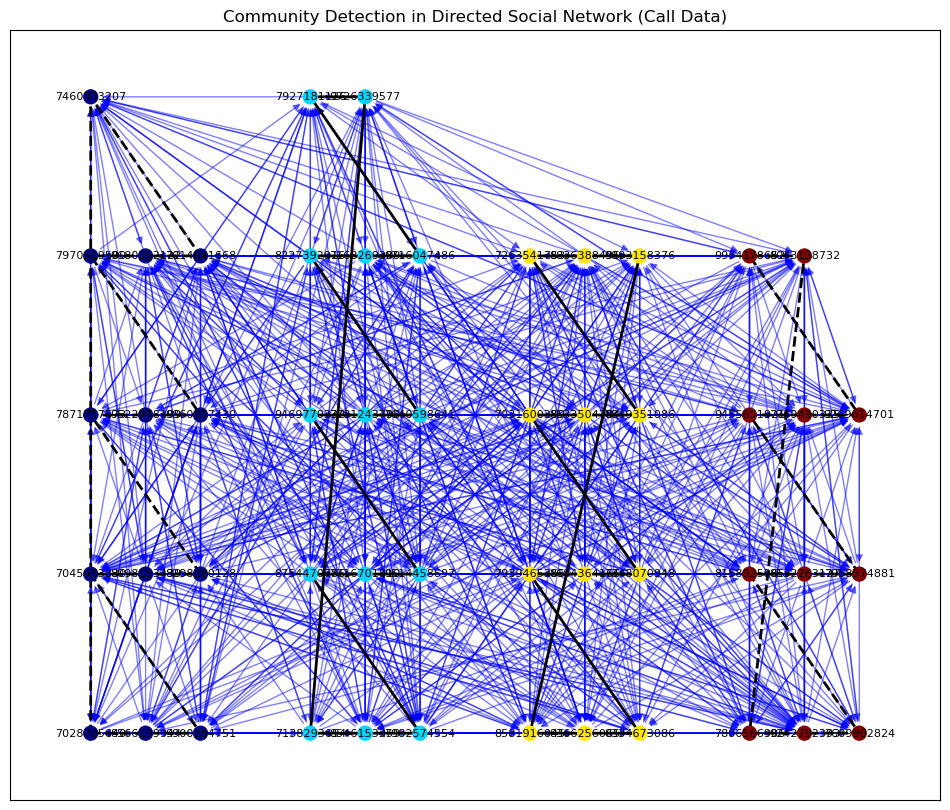

Detected Communities:
Community 3: [7806566906, 9242792393, 7609902824, 8158925965, 8532263127, 7958574881, 9455651921, 7769490335, 9269614701, 9974178652, 8043138732]
Community 1: [7138293654, 8546153259, 7982574554, 8754470786, 7716701810, 9514458697, 9469770332, 7781243798, 7640598641, 8227392916, 7168269389, 9716047486, 7927181126, 9726339577]
Community 2: [8581916045, 8366256065, 8334673086, 7939465365, 8684364166, 7348070948, 7031600359, 8533504784, 8849351086, 7263541753, 8836388495, 9893158376]
Community 0: [7028705640, 8566239944, 9900284751, 7045493330, 8098153439, 8298280128, 7871757573, 9522978199, 9860867430, 7970519500, 9680252122, 7014841668, 7460333207]


In [59]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random

# Create a directed graph G
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Adjust positions within communities to gather nodes together
adjusted_pos = {}

# Increase the proximity between nodes of the same community
community_offset = 2  # Spacing between different communities
for community_id, nodes in communities.items():
    # Create a basic grid layout for each community to keep nodes together
    n = len(nodes)
    if n == 1:
        adjusted_pos[nodes[0]] = (community_offset * community_id, 0)  # Single node in community
    else:
        # Distribute nodes evenly on a grid within the community
        x_pos = [community_offset * community_id + (i % 3) * 0.5 for i in range(n)]  # 3 columns
        y_pos = [i // 3 * 0.5 for i in range(n)]  # 3 rows
        # Assign adjusted positions for nodes
        for node, x, y in zip(nodes, x_pos, y_pos):
            adjusted_pos[node] = (x, y)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, adjusted_pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, adjusted_pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, adjusted_pos, font_size=8, font_color="black")

# Create a random dashed or solid line for each community's border
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = [adjusted_pos[node] for node in nodes]
    
    # Create a polygon around the community
    x_coords, y_coords = zip(*community_pos)
    
    # Randomly choose between dashed or continuous line for the community border
    line_style = '-' if random.choice([True, False]) else '--'  # 50% chance for dashed line
    
    # Add a polygon (border) around the community
    plt.gca().add_patch(plt.Polygon(list(zip(x_coords, y_coords)),
                                     fill=None,
                                     edgecolor='black',
                                     linestyle=line_style,
                                     lw=2))

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.07757777782772782


AttributeError: Rectangle.set() got an unexpected keyword argument 'radius'

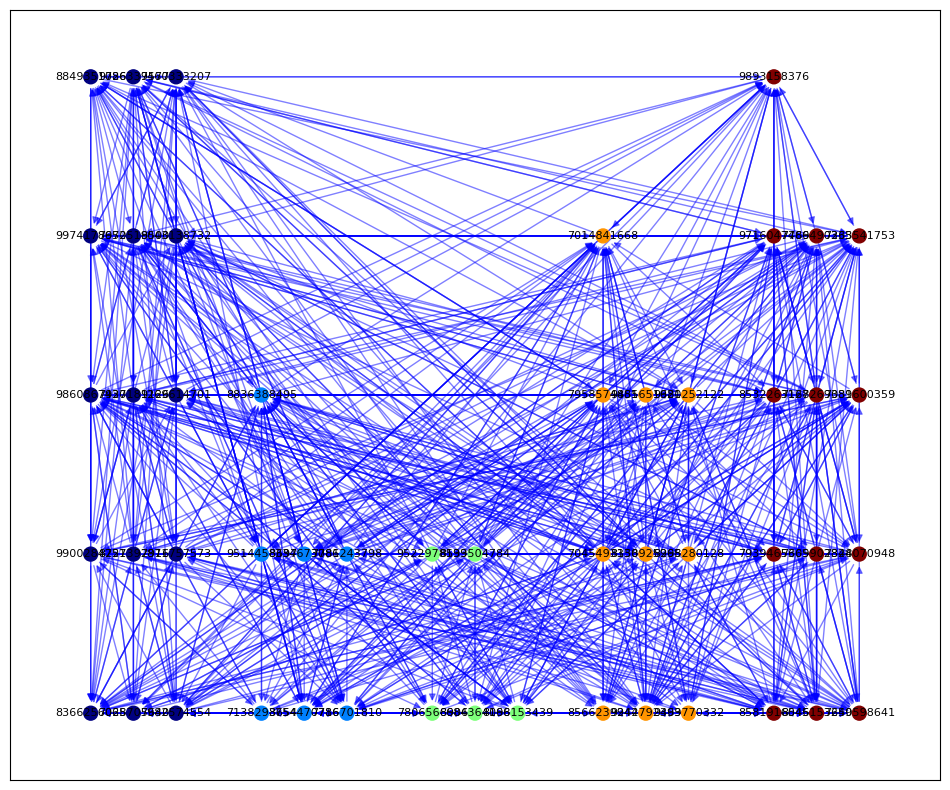

In [61]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random

# Create a directed graph G
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Adjust positions within communities to gather nodes together
adjusted_pos = {}

# Increase the proximity between nodes of the same community
community_offset = 2  # Spacing between different communities
for community_id, nodes in communities.items():
    # Create a basic grid layout for each community to keep nodes together
    n = len(nodes)
    if n == 1:
        adjusted_pos[nodes[0]] = (community_offset * community_id, 0)  # Single node in community
    else:
        # Distribute nodes evenly on a grid within the community
        x_pos = [community_offset * community_id + (i % 3) * 0.5 for i in range(n)]  # 3 columns
        y_pos = [i // 3 * 0.5 for i in range(n)]  # 3 rows
        # Assign adjusted positions for nodes
        for node, x, y in zip(nodes, x_pos, y_pos):
            adjusted_pos[node] = (x, y)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, adjusted_pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, adjusted_pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, adjusted_pos, font_size=8, font_color="black")

# Create a border (rounded or rectangular) around each community
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = [adjusted_pos[node] for node in nodes]
    
    # Find the bounding box of the community
    x_coords, y_coords = zip(*community_pos)
    min_x, max_x = min(x_coords), max(x_coords)
    min_y, max_y = min(y_coords), max(y_coords)
    
    # Add a rounded rectangle around the community using plt.Rectangle
    line_style = '-' if random.choice([True, False]) else '--'  # 50% chance for dashed line
    plt.gca().add_patch(plt.Rectangle((min_x - 0.1, min_y - 0.1),  # Adding slight padding for visibility
                                     max_x - min_x + 0.2,  # Width with padding
                                     max_y - min_y + 0.2,  # Height with padding
                                     linewidth=2,
                                     edgecolor='black',
                                     facecolor='none',
                                     linestyle=line_style,
                                     radius=0.2))  # Rounded corners with radius

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.08872213068877854


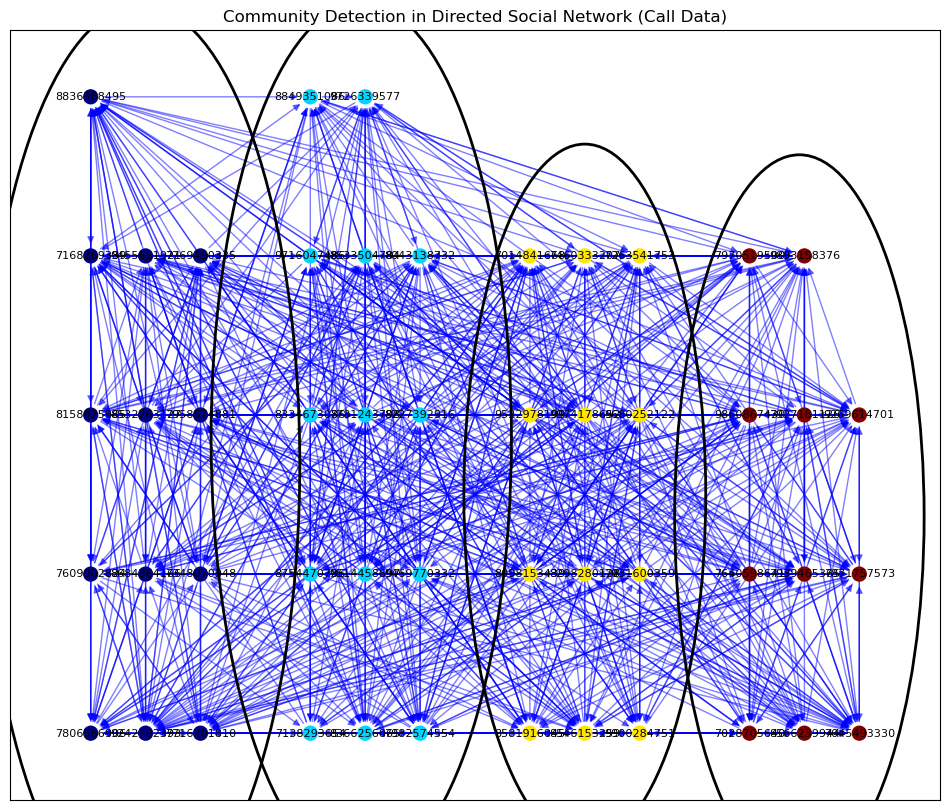

Detected Communities:
Community 0: [7806566906, 9242792393, 7716701810, 7609902824, 8684364166, 7348070948, 8158925965, 8532263127, 7958574881, 7168269389, 9455651921, 7769490335, 8836388495]
Community 1: [7138293654, 8366256065, 7982574554, 8754470786, 9514458697, 9469770332, 8334673086, 7781243798, 8227392916, 9716047486, 8533504784, 8043138732, 8849351086, 9726339577]
Community 2: [8581916045, 8546153259, 9900284751, 8098153439, 8298280128, 7031600359, 9522978199, 9974178652, 9680252122, 7014841668, 7460333207, 7263541753]
Community 3: [7028705640, 8566239944, 7045493330, 7640598641, 7939465365, 7871757573, 9860867430, 7927181126, 9269614701, 7970519500, 9893158376]


In [63]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random
import numpy as np

# Create a directed graph G
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Adjust positions within communities to gather nodes together
adjusted_pos = {}

# Increase the proximity between nodes of the same community
community_offset = 2  # Spacing between different communities
for community_id, nodes in communities.items():
    # Create a basic grid layout for each community to keep nodes together
    n = len(nodes)
    if n == 1:
        adjusted_pos[nodes[0]] = (community_offset * community_id, 0)  # Single node in community
    else:
        # Distribute nodes evenly on a grid within the community
        x_pos = [community_offset * community_id + (i % 3) * 0.5 for i in range(n)]  # 3 columns
        y_pos = [i // 3 * 0.5 for i in range(n)]  # 3 rows
        # Assign adjusted positions for nodes
        for node, x, y in zip(nodes, x_pos, y_pos):
            adjusted_pos[node] = (x, y)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, adjusted_pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, adjusted_pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, adjusted_pos, font_size=8, font_color="black")

# Create a circle around each community
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = np.array([adjusted_pos[node] for node in nodes])
    
    # Find the center and radius for the circle around the community
    center = np.mean(community_pos, axis=0)  # Calculate the center (mean of all node positions)
    radius = np.max(np.linalg.norm(community_pos - center, axis=1))  # Calculate the radius (distance from center to farthest node)
    
    # Draw a circle around the community
    circle = plt.Circle(center, radius + 0.2, edgecolor='black', fill=False, linestyle='-', lw=2)  # Add a little padding to radius
    plt.gca().add_patch(circle)

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


Modularity Score: 0.09849310726945372


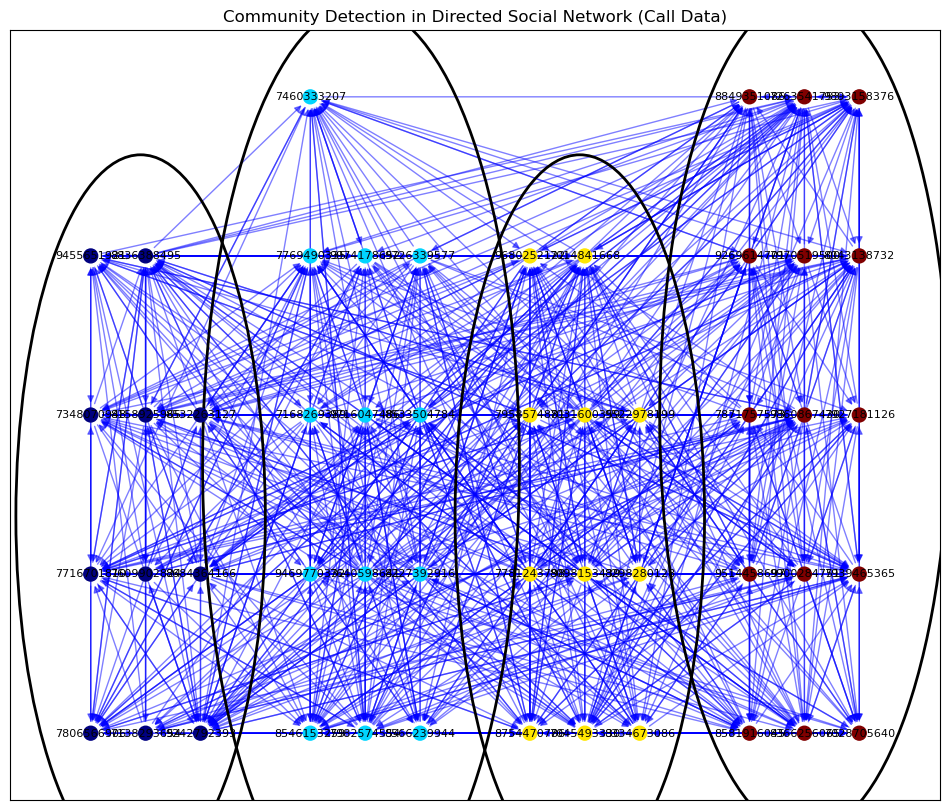

Detected Communities:
Community 0: [7806566906, 7138293654, 9242792393, 7716701810, 7609902824, 8684364166, 7348070948, 8158925965, 8532263127, 9455651921, 8836388495]
Community 3: [8581916045, 8366256065, 7028705640, 9514458697, 9900284751, 7939465365, 7871757573, 9860867430, 7927181126, 9269614701, 7970519500, 8043138732, 8849351086, 7263541753, 9893158376]
Community 1: [8546153259, 7982574554, 8566239944, 9469770332, 7640598641, 8227392916, 7168269389, 9716047486, 8533504784, 7769490335, 9974178652, 9726339577, 7460333207]
Community 2: [8754470786, 7045493330, 8334673086, 7781243798, 8098153439, 8298280128, 7958574881, 7031600359, 9522978199, 9680252122, 7014841668]
Node 123 not found in the graph.
Node 456 not found in the graph.


In [65]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random
import numpy as np

# Create a directed graph G
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Adjust positions within communities to gather nodes together
adjusted_pos = {}

# Increase the proximity between nodes of the same community
community_offset = 2  # Spacing between different communities
for community_id, nodes in communities.items():
    # Create a basic grid layout for each community to keep nodes together
    n = len(nodes)
    if n == 1:
        adjusted_pos[nodes[0]] = (community_offset * community_id, 0)  # Single node in community
    else:
        # Distribute nodes evenly on a grid within the community
        x_pos = [community_offset * community_id + (i % 3) * 0.5 for i in range(n)]  # 3 columns
        y_pos = [i // 3 * 0.5 for i in range(n)]  # 3 rows
        # Assign adjusted positions for nodes
        for node, x, y in zip(nodes, x_pos, y_pos):
            adjusted_pos[node] = (x, y)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, adjusted_pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, adjusted_pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, adjusted_pos, font_size=8, font_color="black")

# Create a circle around each community
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = np.array([adjusted_pos[node] for node in nodes])
    
    # Find the center and radius for the circle around the community
    center = np.mean(community_pos, axis=0)  # Calculate the center (mean of all node positions)
    radius = np.max(np.linalg.norm(community_pos - center, axis=1))  # Calculate the radius (distance from center to farthest node)
    
    # Draw a circle around the community
    circle = plt.Circle(center, radius + 0.2, edgecolor='black', fill=False, linestyle='-', lw=2)  # Add a little padding to radius
    plt.gca().add_patch(circle)

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")


# User Defined Functions (UDFs) for querying community by node (calling party or called party)
def get_community_for_node(node_id):
    """Return the community of the given node."""
    community_id = partition.get(node_id)
    if community_id is not None:
        return f"Node {node_id} belongs to Community {community_id}"
    else:
        return f"Node {node_id} not found in the graph."

def get_community_for_call(call_data):
    """Return the community for both calling and called parties."""
    calling_community = get_community_for_node(call_data['Calling Party'])
    called_community = get_community_for_node(call_data['Called Party'])
    return calling_community, called_community

# Example of how you can use the UDFs:
call_example = {'Calling Party': '123', 'Called Party': '456'}  # Replace these with actual numbers from your data

# Call the function
calling_community, called_community = get_community_for_call(call_example)

print(calling_community)
print(called_community)


Modularity Score: 0.0871059972262744


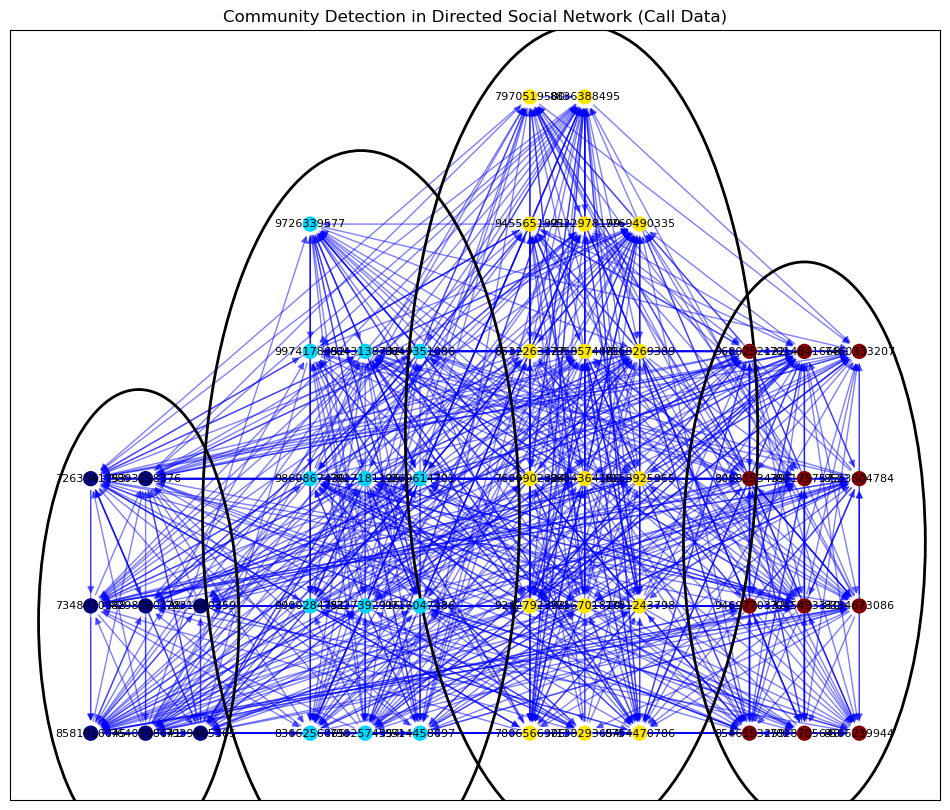

Detected Communities:
Community 2: [7806566906, 7138293654, 8754470786, 9242792393, 7716701810, 7781243798, 7609902824, 8684364166, 8158925965, 8532263127, 7958574881, 7168269389, 9455651921, 9522978199, 7769490335, 7970519500, 8836388495]
Community 0: [8581916045, 7640598641, 7939465365, 7348070948, 8298280128, 7031600359, 7263541753, 9893158376]
Community 1: [8366256065, 7982574554, 9514458697, 9900284751, 8227392916, 9716047486, 9860867430, 7927181126, 9269614701, 9974178652, 8043138732, 8849351086, 9726339577]
Community 3: [8546153259, 7028705640, 8566239944, 9469770332, 7045493330, 8334673086, 8098153439, 7871757573, 8533504784, 9680252122, 7014841668, 7460333207]


Enter the first number (e.g., Calling Party):  9469770332
Enter the second number (e.g., Called Party):  8566239944


Node 9469770332 doesn't exist in the data.
Node 8566239944 doesn't exist in the data.


In [69]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random
import numpy as np

# Create a directed graph G
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Adjust positions within communities to gather nodes together
adjusted_pos = {}

# Increase the proximity between nodes of the same community
community_offset = 2  # Spacing between different communities
for community_id, nodes in communities.items():
    # Create a basic grid layout for each community to keep nodes together
    n = len(nodes)
    if n == 1:
        adjusted_pos[nodes[0]] = (community_offset * community_id, 0)  # Single node in community
    else:
        # Distribute nodes evenly on a grid within the community
        x_pos = [community_offset * community_id + (i % 3) * 0.5 for i in range(n)]  # 3 columns
        y_pos = [i // 3 * 0.5 for i in range(n)]  # 3 rows
        # Assign adjusted positions for nodes
        for node, x, y in zip(nodes, x_pos, y_pos):
            adjusted_pos[node] = (x, y)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, adjusted_pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, adjusted_pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, adjusted_pos, font_size=8, font_color="black")

# Create a circle around each community
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = np.array([adjusted_pos[node] for node in nodes])
    
    # Find the center and radius for the circle around the community
    center = np.mean(community_pos, axis=0)  # Calculate the center (mean of all node positions)
    radius = np.max(np.linalg.norm(community_pos - center, axis=1))  # Calculate the radius (distance from center to farthest node)
    
    # Draw a circle around the community
    circle = plt.Circle(center, radius + 0.2, edgecolor='black', fill=False, linestyle='-', lw=2)  # Add a little padding to radius
    plt.gca().add_patch(circle)

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")

# User input to check community for two numbers
def get_community_for_node(node_id):
    """Return the community of the given node."""
    community_id = partition.get(node_id)
    if community_id is not None:
        return f"Node {node_id} belongs to Community {community_id}"
    else:
        return f"Node {node_id} doesn't exist in the data."

# Ask for user input
node1 = input("Enter the first number (e.g., Calling Party): ")
node2 = input("Enter the second number (e.g., Called Party): ")

# Check if the numbers exist and display the community they belong to
community1 = get_community_for_node(node1)
community2 = get_community_for_node(node2)

print(community1)
print(community2)


Modularity Score: 0.08839845444594044


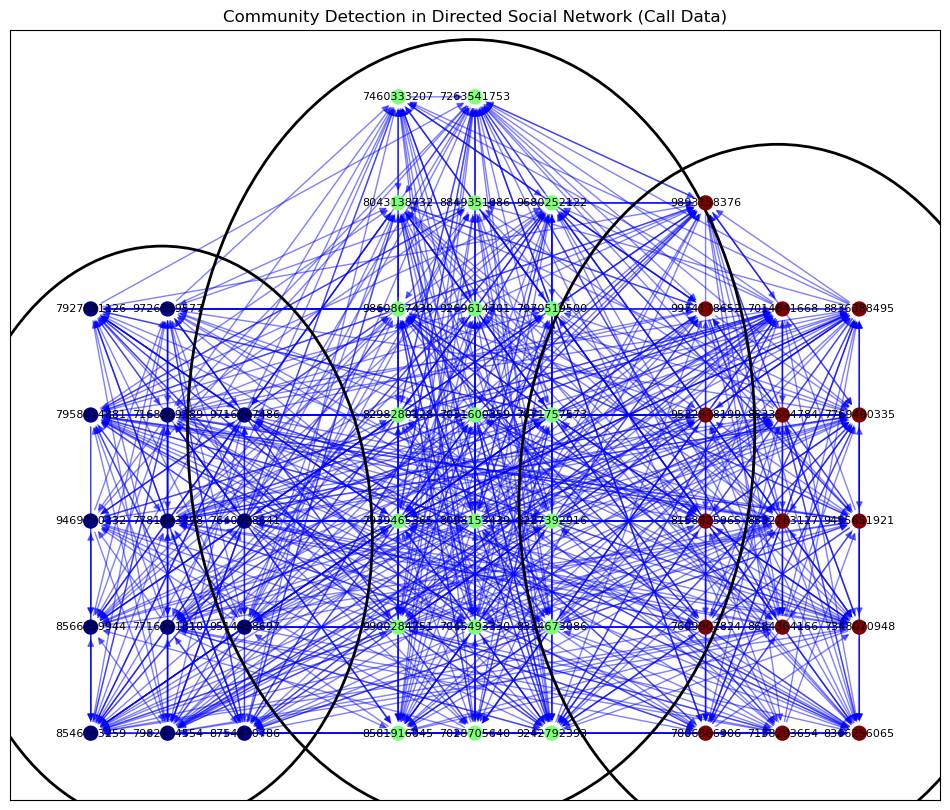

Detected Communities:
Community 2: [7806566906, 7138293654, 8366256065, 7609902824, 8684364166, 7348070948, 8158925965, 8532263127, 9455651921, 9522978199, 8533504784, 7769490335, 9974178652, 7014841668, 8836388495, 9893158376]
Community 1: [8581916045, 7028705640, 9242792393, 9900284751, 7045493330, 8334673086, 7939465365, 8098153439, 8227392916, 8298280128, 7031600359, 7871757573, 9860867430, 9269614701, 7970519500, 8043138732, 8849351086, 9680252122, 7460333207, 7263541753]
Community 0: [8546153259, 7982574554, 8754470786, 8566239944, 7716701810, 9514458697, 9469770332, 7781243798, 7640598641, 7958574881, 7168269389, 9716047486, 7927181126, 9726339577]


Enter the first number (e.g., Calling Party):  7806566906
Enter the second number (e.g., Called Party):  7138293654


Node 7806566906 doesn't exist in the data.
Node 7138293654 doesn't exist in the data.


In [73]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random
import numpy as np

# Create a directed graph G
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Adjust positions within communities to gather nodes together
adjusted_pos = {}

# Increase the proximity between nodes of the same community
community_offset = 2  # Spacing between different communities
for community_id, nodes in communities.items():
    # Create a basic grid layout for each community to keep nodes together
    n = len(nodes)
    if n == 1:
        adjusted_pos[nodes[0]] = (community_offset * community_id, 0)  # Single node in community
    else:
        # Distribute nodes evenly on a grid within the community
        x_pos = [community_offset * community_id + (i % 3) * 0.5 for i in range(n)]  # 3 columns
        y_pos = [i // 3 * 0.5 for i in range(n)]  # 3 rows
        # Assign adjusted positions for nodes
        for node, x, y in zip(nodes, x_pos, y_pos):
            adjusted_pos[node] = (x, y)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, adjusted_pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, adjusted_pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, adjusted_pos, font_size=8, font_color="black")

# Create a circle around each community
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = np.array([adjusted_pos[node] for node in nodes])
    
    # Find the center and radius for the circle around the community
    center = np.mean(community_pos, axis=0)  # Calculate the center (mean of all node positions)
    radius = np.max(np.linalg.norm(community_pos - center, axis=1))  # Calculate the radius (distance from center to farthest node)
    
    # Draw a circle around the community
    circle = plt.Circle(center, radius + 0.2, edgecolor='black', fill=False, linestyle='-', lw=2)  # Add a little padding to radius
    plt.gca().add_patch(circle)

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")

# User input to check community for two numbers
def get_community_for_node(node_id):
    """Return the community of the given node."""
    community_id = partition.get(node_id)
    if community_id is not None:
        return community_id
    else:
        return None

# Ask for user input
node1 = input("Enter the first number (e.g., Calling Party): ")
node2 = input("Enter the second number (e.g., Called Party): ")

# Check if the numbers exist and display the community they belong to
community1 = get_community_for_node(node1)
community2 = get_community_for_node(node2)

if community1 is None:
    print(f"Node {node1} doesn't exist in the data.")
else:
    print(f"Node {node1} belongs to Community {community1}")

if community2 is None:
    print(f"Node {node2} doesn't exist in the data.")
else:
    print(f"Node {node2} belongs to Community {community2}")

# Check if they belong to the same community
if community1 is not None and community2 is not None:
    if community1 == community2:
        print(f"Node {node1} and Node {node2} belong to the same community (Community {community1}).")
    else:
        print(f"Node {node1} and Node {node2} are not in the same community.")

Modularity Score: 0.08495040335904008


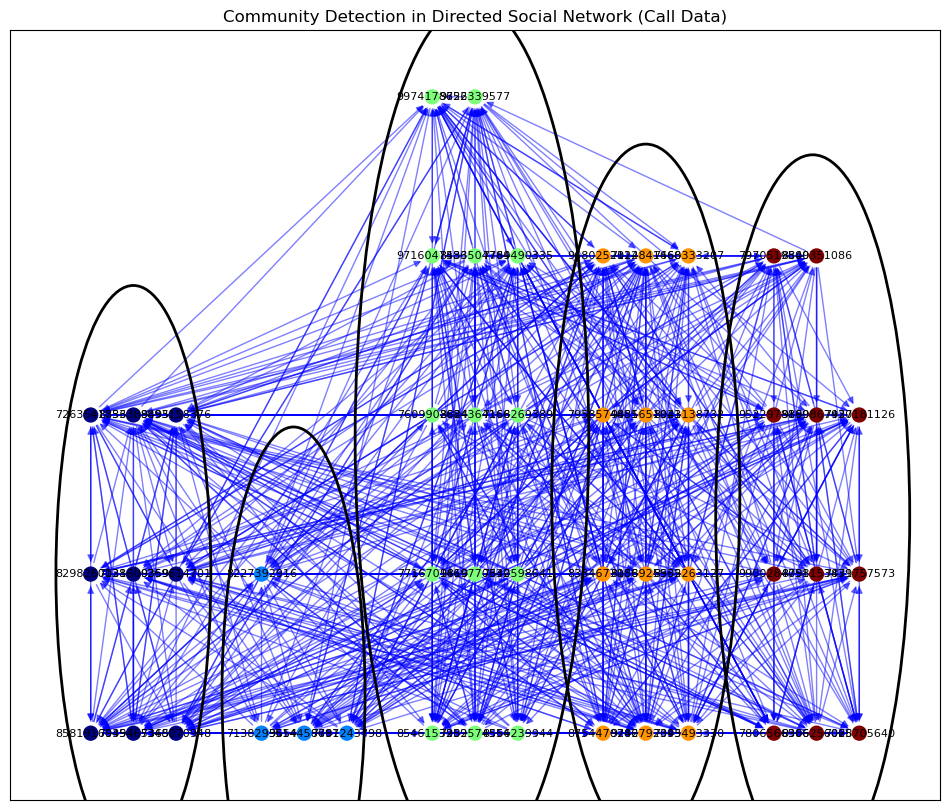

Detected Communities:
Community 4: [7806566906, 8366256065, 7028705640, 9900284751, 8098153439, 7871757573, 9522978199, 9860867430, 7927181126, 7970519500, 8849351086]
Community 1: [7138293654, 9514458697, 7781243798, 8227392916]
Community 0: [8581916045, 7939465365, 7348070948, 8298280128, 7031600359, 9269614701, 7263541753, 8836388495, 9893158376]
Community 2: [8546153259, 7982574554, 8566239944, 7716701810, 9469770332, 7640598641, 7609902824, 8684364166, 7168269389, 9716047486, 8533504784, 7769490335, 9974178652, 9726339577]
Community 3: [8754470786, 9242792393, 7045493330, 8334673086, 8158925965, 8532263127, 7958574881, 9455651921, 8043138732, 9680252122, 7014841668, 7460333207]


Enter the first number (e.g., Calling Party):  9242792393
Enter the second number (e.g., Called Party):  8334673086


Both Node 9242792393 and Node 8334673086 don't exist in the data.


In [75]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random
import numpy as np

# Create a directed graph G
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Adjust positions within communities to gather nodes together
adjusted_pos = {}

# Increase the proximity between nodes of the same community
community_offset = 2  # Spacing between different communities
for community_id, nodes in communities.items():
    # Create a basic grid layout for each community to keep nodes together
    n = len(nodes)
    if n == 1:
        adjusted_pos[nodes[0]] = (community_offset * community_id, 0)  # Single node in community
    else:
        # Distribute nodes evenly on a grid within the community
        x_pos = [community_offset * community_id + (i % 3) * 0.5 for i in range(n)]  # 3 columns
        y_pos = [i // 3 * 0.5 for i in range(n)]  # 3 rows
        # Assign adjusted positions for nodes
        for node, x, y in zip(nodes, x_pos, y_pos):
            adjusted_pos[node] = (x, y)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, adjusted_pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, adjusted_pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, adjusted_pos, font_size=8, font_color="black")

# Create a circle around each community
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = np.array([adjusted_pos[node] for node in nodes])
    
    # Find the center and radius for the circle around the community
    center = np.mean(community_pos, axis=0)  # Calculate the center (mean of all node positions)
    radius = np.max(np.linalg.norm(community_pos - center, axis=1))  # Calculate the radius (distance from center to farthest node)
    
    # Draw a circle around the community
    circle = plt.Circle(center, radius + 0.2, edgecolor='black', fill=False, linestyle='-', lw=2)  # Add a little padding to radius
    plt.gca().add_patch(circle)

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")

# User input to check community for two numbers
def get_community_for_node(node_id):
    """Return the community of the given node."""
    community_id = partition.get(node_id)
    if community_id is not None:
        return community_id
    else:
        return None

# Ask for user input
node1 = input("Enter the first number (e.g., Calling Party): ")
node2 = input("Enter the second number (e.g., Called Party): ")

# Check if the numbers exist and display the community they belong to
community1 = get_community_for_node(node1)
community2 = get_community_for_node(node2)

if community1 is None and community2 is None:
    print(f"Both Node {node1} and Node {node2} don't exist in the data.")
elif community1 is None:
    print(f"Node {node1} doesn't exist in the data.")
elif community2 is None:
    print(f"Node {node2} doesn't exist in the data.")
else:
    # Check if they belong to the same community
    if community1 == community2:
        print(f"Node {node1} and Node {node2} belong to the same community (Community {community1}).")
    else:
        print(f"Node {node1} and Node {node2} are in different communities: Node {node1} is in Community {community1}, and Node {node2} is in Community {community2}.")


Modularity Score: 0.09064283450478658


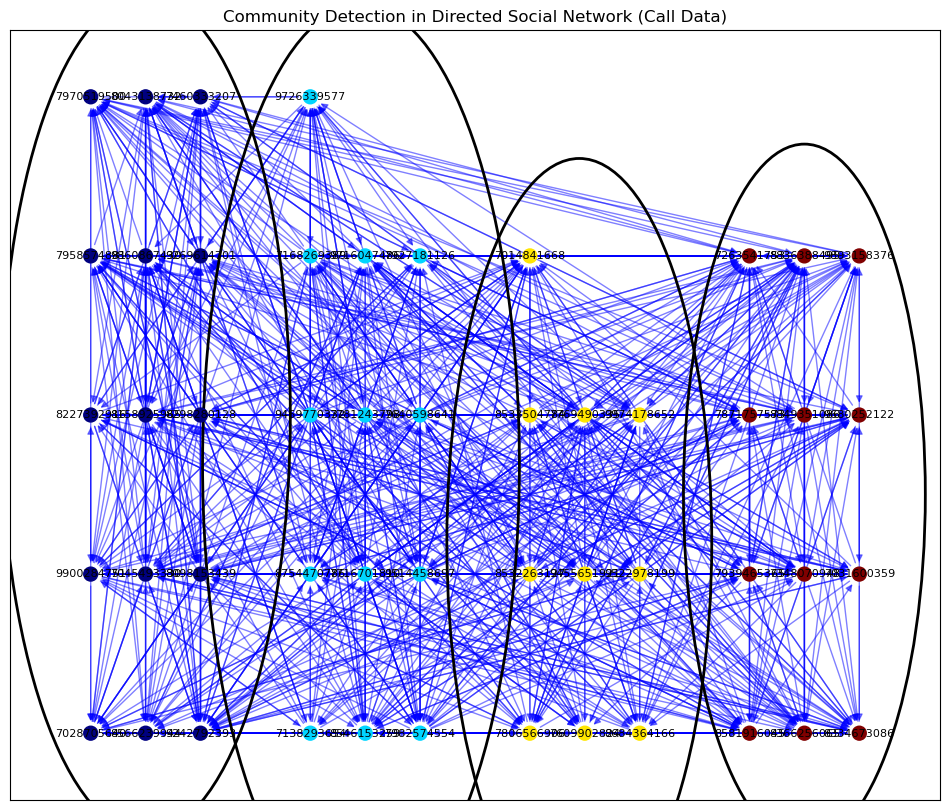

Detected Communities:
Community 2: [7806566906, 7609902824, 8684364166, 8532263127, 9455651921, 9522978199, 8533504784, 7769490335, 9974178652, 7014841668]
Community 1: [7138293654, 8546153259, 7982574554, 8754470786, 7716701810, 9514458697, 9469770332, 7781243798, 7640598641, 7168269389, 9716047486, 7927181126, 9726339577]
Community 3: [8581916045, 8366256065, 8334673086, 7939465365, 7348070948, 7031600359, 7871757573, 8849351086, 9680252122, 7263541753, 8836388495, 9893158376]
Community 0: [7028705640, 8566239944, 9242792393, 9900284751, 7045493330, 8098153439, 8227392916, 8158925965, 8298280128, 7958574881, 9860867430, 9269614701, 7970519500, 8043138732, 7460333207]


Enter the first node identifier:  9242792393
Enter the second node identifier:  8566239944


One or both of the nodes do not exist in the data.


In [77]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random
import numpy as np

# Assuming df is already available with 'Calling Party' and 'Called Party' columns.
# Example dataframe setup (you may need to replace this with your actual dataframe)
# df = pd.DataFrame({'Calling Party': ['A', 'B', 'C'], 'Called Party': ['B', 'C', 'A']})

# Create a directed graph G
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Adjust positions within communities to gather nodes together
adjusted_pos = {}

# Increase the proximity between nodes of the same community
community_offset = 2  # Spacing between different communities
for community_id, nodes in communities.items():
    # Create a basic grid layout for each community to keep nodes together
    n = len(nodes)
    if n == 1:
        adjusted_pos[nodes[0]] = (community_offset * community_id, 0)  # Single node in community
    else:
        # Distribute nodes evenly on a grid within the community
        x_pos = [community_offset * community_id + (i % 3) * 0.5 for i in range(n)]  # 3 columns
        y_pos = [i // 3 * 0.5 for i in range(n)]  # 3 rows
        # Assign adjusted positions for nodes
        for node, x, y in zip(nodes, x_pos, y_pos):
            adjusted_pos[node] = (x, y)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, adjusted_pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, adjusted_pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, adjusted_pos, font_size=8, font_color="black")

# Create a circle around each community
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = np.array([adjusted_pos[node] for node in nodes])
    
    # Find the center and radius for the circle around the community
    center = np.mean(community_pos, axis=0)  # Calculate the center (mean of all node positions)
    radius = np.max(np.linalg.norm(community_pos - center, axis=1))  # Calculate the radius (distance from center to farthest node)
    
    # Draw a circle around the community
    circle = plt.Circle(center, radius + 0.2, edgecolor='black', fill=False, linestyle='-', lw=2)  # Add a little padding to radius
    plt.gca().add_patch(circle)

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")

# Function to handle user input for checking communities
def check_community():
    try:
        # Ask user for two node identifiers
        node1 = input("Enter the first node identifier: ")
        node2 = input("Enter the second node identifier: ")

        # Check if nodes exist in the graph
        if node1 not in G.nodes() or node2 not in G.nodes():
            print("One or both of the nodes do not exist in the data.")
            return
        
        # Get the community ids for both nodes
        community1 = partition.get(node1)
        community2 = partition.get(node2)

        # Check if they belong to the same community or different communities
        if community1 == community2:
            print(f"Both nodes belong to Community {community1}.")
        else:
            print(f"Node {node1} belongs to Community {community1}, and Node {node2} belongs to Community {community2}.")
    except Exception as e:
        print(f"An error occurred: {e}")

# Call the function to check user input
check_community()


Modularity Score: 0.09182852351934978


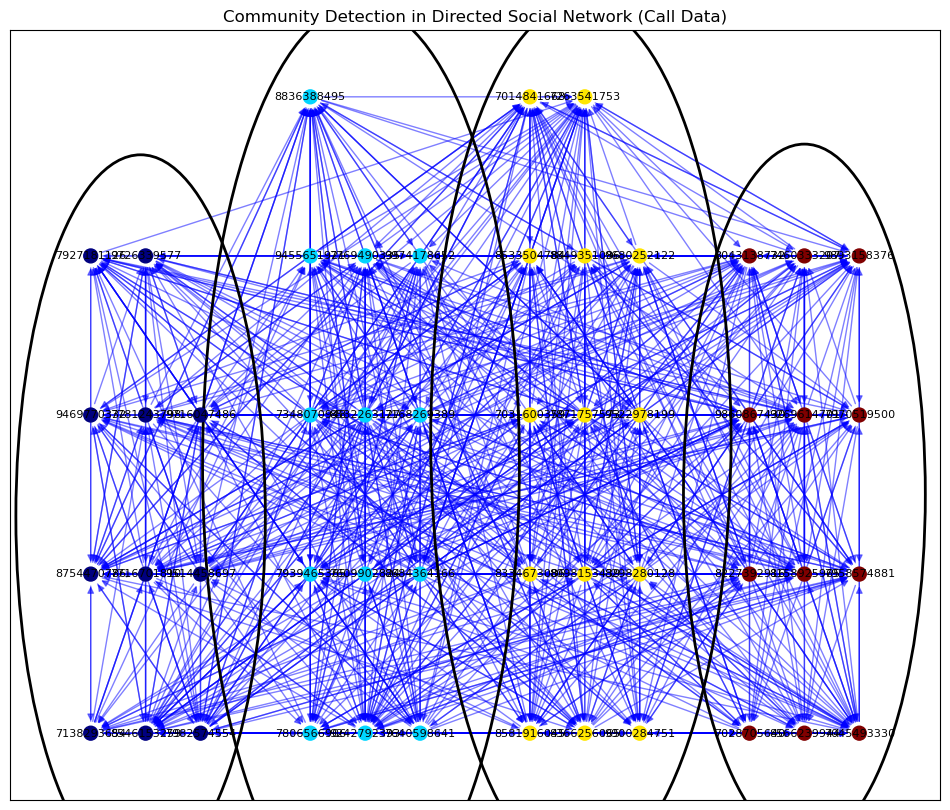

Detected Communities:
Community 1: [7806566906, 9242792393, 7640598641, 7939465365, 7609902824, 8684364166, 7348070948, 8532263127, 7168269389, 9455651921, 7769490335, 9974178652, 8836388495]
Community 0: [7138293654, 8546153259, 7982574554, 8754470786, 7716701810, 9514458697, 9469770332, 7781243798, 9716047486, 7927181126, 9726339577]
Community 2: [8581916045, 8366256065, 9900284751, 8334673086, 8098153439, 8298280128, 7031600359, 7871757573, 9522978199, 8533504784, 8849351086, 9680252122, 7014841668, 7263541753]
Community 3: [7028705640, 8566239944, 7045493330, 8227392916, 8158925965, 7958574881, 9860867430, 9269614701, 7970519500, 8043138732, 7460333207, 9893158376]


Enter the first node identifier:  7045493330
Enter the second node identifier:  8566239944


One or both of the nodes do not exist in the data.


In [79]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import random
import numpy as np

# Assuming df is already available with 'Calling Party' and 'Called Party' columns.
# Example dataframe setup (you may need to replace this with your actual dataframe)
# df = pd.DataFrame({'Calling Party': ['A', 'B', 'C'], 'Called Party': ['B', 'C', 'A']})

# Create a directed graph G
G = nx.DiGraph()

# Add edges to the graph with direction (using df as your data source)
for _, row in df.iterrows():
    G.add_edge(row['Calling Party'], row['Called Party'])  # Direction from caller_id to receiver_id

# Apply the Louvain method for community detection
partition = community_louvain.best_partition(G.to_undirected())  # Convert to undirected for community detection

# Compute the modularity score
modularity_score = community_louvain.modularity(partition, G.to_undirected())
print(f"Modularity Score: {modularity_score}")

# Visualize the communities with improved layout
plt.figure(figsize=(12, 10))

# Group nodes by community
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = []
    communities[community_id].append(node)

# Adjust positions within communities to gather nodes together
adjusted_pos = {}

# Increase the proximity between nodes of the same community
community_offset = 2  # Spacing between different communities
for community_id, nodes in communities.items():
    # Create a basic grid layout for each community to keep nodes together
    n = len(nodes)
    if n == 1:
        adjusted_pos[nodes[0]] = (community_offset * community_id, 0)  # Single node in community
    else:
        # Distribute nodes evenly on a grid within the community
        x_pos = [community_offset * community_id + (i % 3) * 0.5 for i in range(n)]  # 3 columns
        y_pos = [i // 3 * 0.5 for i in range(n)]  # 3 rows
        # Assign adjusted positions for nodes
        for node, x, y in zip(nodes, x_pos, y_pos):
            adjusted_pos[node] = (x, y)

# Nodes colored by community
colors = [partition[node] for node in G.nodes()]
nx.draw_networkx_nodes(G, adjusted_pos, node_color=colors, cmap=plt.cm.jet, node_size=100)

# Draw directed edges
nx.draw_networkx_edges(G, adjusted_pos, alpha=0.5, edgelist=G.edges(), arrows=True, edge_color="blue")

# Draw node labels
nx.draw_networkx_labels(G, adjusted_pos, font_size=8, font_color="black")

# Create a circle around each community
for community_id, nodes in communities.items():
    # Get the positions of the nodes in this community
    community_pos = np.array([adjusted_pos[node] for node in nodes])
    
    # Find the center and radius for the circle around the community
    center = np.mean(community_pos, axis=0)  # Calculate the center (mean of all node positions)
    radius = np.max(np.linalg.norm(community_pos - center, axis=1))  # Calculate the radius (distance from center to farthest node)
    
    # Draw a circle around the community
    circle = plt.Circle(center, radius + 0.2, edgecolor='black', fill=False, linestyle='-', lw=2)  # Add a little padding to radius
    plt.gca().add_patch(circle)

plt.title("Community Detection in Directed Social Network (Call Data)")
plt.show()

# Display the detected communities
print("Detected Communities:")
for community_id, members in communities.items():
    print(f"Community {community_id}: {members}")

# Function to handle user input for checking communities
def check_community():
    try:
        # Ask user for two node identifiers
        node1 = input("Enter the first node identifier: ")
        node2 = input("Enter the second node identifier: ")

        # Check if nodes exist in the graph
        if node1 not in G.nodes() or node2 not in G.nodes():
            print("One or both of the nodes do not exist in the data.")
            return
        
        # Get the community ids for both nodes
        community1 = partition.get(node1)
        community2 = partition.get(node2)

        # Check if they belong to the same community or different communities
        if community1 == community2:
            print(f"Both nodes belong to Community {community1}.")
        else:
            print(f"Node {node1} belongs to Community {community1}, and Node {node2} belongs to Community {community2}.")
    except Exception as e:
        print(f"An error occurred: {e}")

# Call the function to check user input
check_community()
